# GA

*   Introduction: https://www.youtube.com/watch?v=uQj5UNhCPuo
*   Python Code Example: https://www.youtube.com/watch?v=nhT56blfRpE

In [ ]:
!pip install vispm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [1]:
!pip install -U -q pm4py

import pandas as pd
import numpy as np
import pm4py
import seaborn as sns
import matplotlib.pyplot as plt

from google.colab import drive
drive.mount('/content/drive')

     |████████████████████████████████| 1.5 MB 5.1 MB/s 
     |████████████████████████████████| 748 kB 58.0 MB/s 
     |████████████████████████████████| 40 kB 4.5 MB/s 
     |████████████████████████████████| 1.6 MB 35.1 MB/s 
Mounted at /content/drive


In [2]:
#move to the directory where the module are located for duration_statistics_module  and social_network_analysis_module
%cd /content/drive/MyDrive/Abou Keita - Capstone 606/Python Notebooks
import duration_statistics_module 
import social_network_analysis_module

/content/drive/.shortcut-targets-by-id/1ciOd6JJn15yFRl7lXb8wUDf4DEFkFYlV/Abou Keita - Capstone 606/Python Notebooks


In [ ]:
from collections import namedtuple
from random import choices, randint, randrange, random
from typing import List, Optional, Callable, Tuple

Genome = List[int]
Population = List[Genome]
PopulateFunc = Callable[[], Population]
FitnessFunc = Callable[[Genome], int]
SelectionFunc = Callable[[Population, FitnessFunc], Tuple[Genome, Genome]]
CrossoverFunc = Callable[[Genome, Genome], Tuple[Genome, Genome]]
MutationFunc = Callable[[Genome], Genome]
PrinterFunc = Callable[[Population, int, FitnessFunc], None]

# Review Example Dataset

In [ ]:
#Activities = namedtuple( 'Activities', ['name','aggregated_max_relative_day', 'weight'])
Activities = namedtuple( 'Activities', ['name','days_to_finish', 'percentage'])

max_days = 261865

things = [
          
          Activities('accept',85800 , 7),
          Activities('collect reviews',250 , 14),
          Activities('decide',251 , 1),
          Activities('get review 1',17 , 14),
          Activities('get review 2',17 , 14),
          Activities('get review 3',17 , 14),
          Activities('get review X',87109 , 59),
          Activities('invite additional reviewer',87108 , 59),
          Activities('invite reviewers',12 , 14),
          Activities('reject' ,87113 , 0),
          Activities('time-out 1',22 , 14),
          Activities('time-out 2',22 , 14),
          Activities('time-out 3',22 , 14),
          Activities('time-out X',86967 , 58),
        ]

In [ ]:
def generate_genome(length: int) -> Genome:
    return choices([0, 1], k=length)

In [ ]:
def generate_population(size: int, genome_length: int) -> Population:
    return [generate_genome(genome_length) for _ in range(size)]  

In [ ]:
def fitness(genome: Genome, things: List[Activities], percentage_limit: int) -> int:
  if len(genome) != len(things):
    raise ValueError( "genome and Activities must be the same length")
  
  percentage = 0
  days_to_finish = 0

  for i, Activities in enumerate(things):
    if genome[i] == 1:
      percentage += Activities.percentage
      days_to_finish += Activities.days_to_finish
      
    if percentage > percentage_limit:
      return 0

  return days_to_finish 


In [ ]:
def selection_pair(population: Population, fitness_func: FitnessFunc) -> Population:
    return choices(
        population = population,
        percentages = [fitness_func(gene) for gene in population],
        k=2
    )


In [ ]:
def single_point_crossover(a: Genome, b: Genome) -> Tuple[Genome, Genome]:
  if len(a) != len(b):
    raise ValueError("Genome a and b must be of the same length")
  
  length = len(a)
  if length < 2:
    return a,b

  
  p = randint(1, length -1)
  return a[0:p] + b[p:], b[0:p], a[p:]

In [ ]:
def mutation(genome: Genome, num: int = 1, probability: float = 0.5) -> Genome:
    for _ in range(num):
        index = randrange(len(genome))
        genome[index] = genome[index] if random() > probability else abs(genome[index] - 1)
    return genome

In [ ]:
def run_evolution(
      populate_func: PopulateFunc,
      fitness_func: FitnessFunc,
      fitness_limit: int,
      selection_func: SelectionFunc = selection_pair,
      crossover_func: CrossoverFunc = single_point_crossover,
      mutation_func: MutationFunc = mutation,
      generation_limit: int = 100) -> Tuple[Population, int]:

    population = populate_func()

    for i in range(generation_limit):
      population = sorted(population, key=lambda genome: fitness_func(genome), reverse=True)

      if fitness_func(population[0]) >=fitness_limit:
        break
      
      next_generation = population[0:2]

      for j in range(int(len(population) / 2) - 1):
        parents = selection_func(population, fitness_func)
        offspring_a, offspring_b = crossover_func(parents[0], parents[1])
        offspring_a = mutation_func(offspring_a)
        offspring_b = mutation_func(offspring_b)
        next_generation += [offspring_a, offspring_b]

      population = next_generation

    population = sorted(population, key=lambda genome: fitness_func(genome),reverse=True)
    return population, i

In [ ]:
import time
from functools import partial

In [ ]:
start = time.time()

population, generations = run_evolution(
    populate_func= partial(generate_population, size=14, genome_length=len(things)),                         
    fitness_func=partial(fitness, things=things, percentage_limit=100),
    fitness_limit = 100,
    generation_limit=100) 

end = time.time()

In [ ]:
def genome_to_things(genome: Genome, things: List[Activities]) -> List[Activities]:
  result = []
  for i, Activities in enumerate(things):
    if genome[i] == 1:
      result += [Activities.name]
  return result

In [ ]:
print(f"number of generations: {generations}")
print(f"time: {end - start}s")
print(f"best solution: {genome_to_things(population[0], things)}")

number of generations: 0
time: 0.00040149688720703125s
best solution: ['accept', 'decide', 'get review 1', 'get review 2', 'get review 3', 'invite reviewers', 'reject']


## Simple Genetic Algorithm Model

In [ ]:
review_example_log = pm4py.read_xes('/content/drive/MyDrive/Abou Keita - Capstone 606/Datasets/review_example_large.xes')
reviewlog = pm4py.convert_to_event_log(review_example_log)

parsing log, completed traces ::   0%|          | 0/10000 [00:00<?, ?it/s]

/usr/local/lib/python3.8/dist-packages/pm4py/utils.py:486: UserWarning: the EventLog class has been deprecated and will be removed in a future release.
  warnings.warn("the EventLog class has been deprecated and will be removed in a future release.")


In [ ]:
#drop the columns not part of the fitness
rows= ['invite reviewers','get review 1', 'get review 2' ,'get review 3','decide','accept','reject']
GA_model_df =review_example_log[review_example_log['concept:name'].isin(rows)]


In [ ]:
GA_model = pm4py.convert_to_event_log(GA_model_df)

/usr/local/lib/python3.8/dist-packages/pm4py/utils.py:486: UserWarning: the EventLog class has been deprecated and will be removed in a future release.
  warnings.warn("the EventLog class has been deprecated and will be removed in a future release.")


BPMN Model

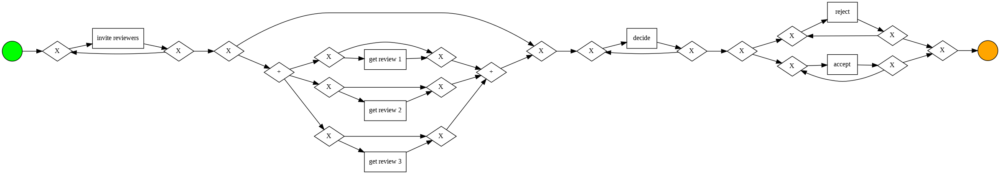

In [ ]:
cp_bpmn_model = pm4py.discover_bpmn_inductive(GA_model)
pm4py.view_bpmn(cp_bpmn_model)

dfg model

<ipython-input-132-76b93a604bd5>:1: DeprecatedWarning: discover_dfg is deprecated as of 2.3.0 and will be removed in 2.4.0. this method will be replaced by the discover_dfg_typed function(). Please adapt your code to use pm4py.discover_dfg_typed()
  cpdfg, cp_start_activities, cp_end_activities = pm4py.discover_dfg(GA_model)


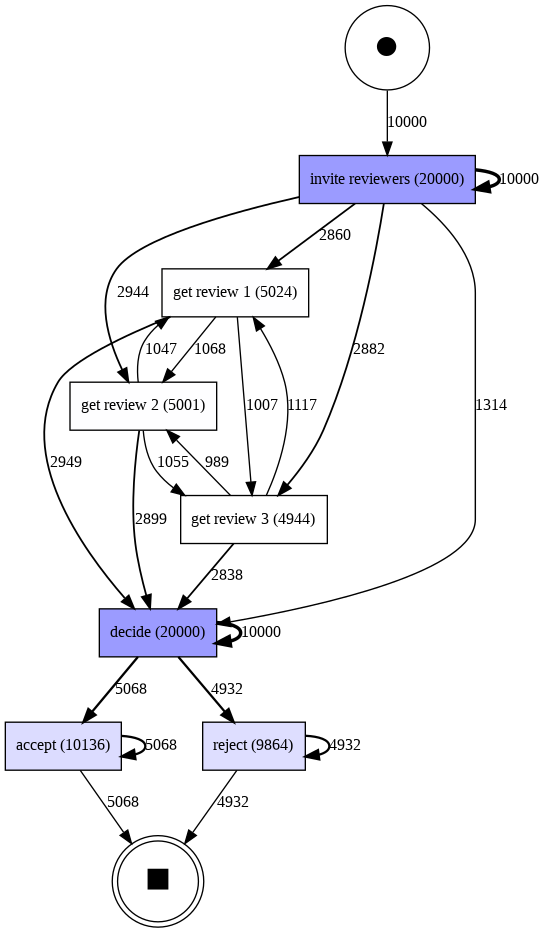

In [ ]:
cpdfg, cp_start_activities, cp_end_activities = pm4py.discover_dfg(GA_model)
pm4py.view_dfg(cpdfg, cp_start_activities, cp_end_activities)

heuritic miner model

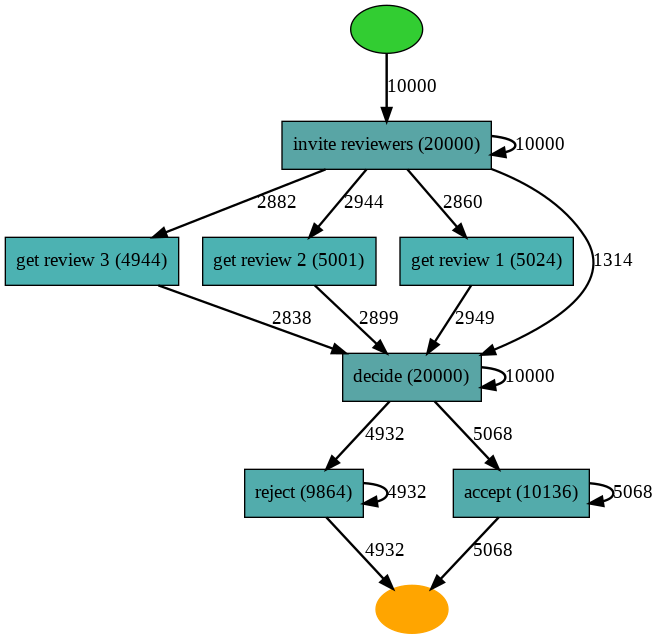

In [ ]:
#show the heuritic miner model
cp_map = pm4py.discover_heuristics_net(GA_model)
pm4py.view_heuristics_net(cp_map)

In [ ]:
# number of event in the cpm event log
num_event = len(GA_model_df)
num_cases = len(GA_model_df['case:concept:name'].unique())
print("number of event: {} \n Number of unique cases: {}".format(num_event, num_cases))
ppl_invovled = GA_model_df['org:resource'].unique()
num_ppl_invovled = len(GA_model_df['org:resource'].unique())
print("The resources or people invovled are: {} \n The number of resources are: {}".format(ppl_invovled, num_ppl_invovled))

number of event: 74969 
 Number of unique cases: 10000
The resources or people invovled are: ['Mike' 'Mary' 'Pam' 'Wil' 'Anne' 'Carol' 'Pete' 'John' 'Sam' 'Sara'] 
 The number of resources are: 10


### Model Evaluation - Conformance checking

Conformance checking techniques compare a process model with an event log of the same process. The goal is to check if the event log conforms to the model, and, vice versa. Only works with Petri Net models
- https://pm4py.fit.fraunhofer.de/static/assets/api/2.3.0/apihtml#conformance-checking-pm4py-conformance

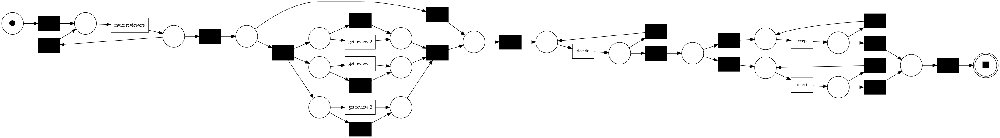

In [ ]:
# conversion to petri net
p_net, pnet_im, pnet_fm = pm4py.convert_to_petri_net(cp_bpmn_model)
pm4py.view_petri_net(p_net, pnet_im, pnet_fm)

Soundness

In [ ]:
#Checking Behavioral Model Properties
pm4py.check_soundness(p_net, pnet_im, pnet_fm)

#from pm4py.algo.analysis.woflan import algorithm as woflan
#is_sound = woflan.apply(p_net, pnet_im, pnet_fm, parameters={woflan.Parameters.RETURN_ASAP_WHEN_NOT_SOUND: False,
#                                                     woflan.Parameters.PRINT_DIAGNOSTICS: True,
#                                                     woflan.Parameters.RETURN_DIAGNOSTICS: False})

Input is ok.
Petri Net is a workflow net.
Every place is covered by s-components.
There are no dead tasks.
All tasks are live.


/usr/local/lib/python3.8/dist-packages/pm4py/util/lp/variants/scipy_solver.py:26: OptimizeWarning: A_eq does not appear to be of full row rank. To improve performance, check the problem formulation for redundant equality constraints.
  sol = linprog(c, A_ub=Aub, b_ub=bub, A_eq=Aeq, b_eq=beq, method="revised simplex")


True

Replay Fitness

The fitness  of an event log  w.r.t. a model  is the fraction of log behavior that is described by the model.

 1 = all behavior described by the event log is also described by the model

 0 = none of the behavior described by the event log is also described by the mode

 - For token-based replay, the percentage of traces that are completely fit is returned, along with a fitness value that is calculated.
 - For alignments, the percentage of traces that are completely fit is returned, along with a fitness value that is calculated as the average of the fitness values of the single traces.

In [ ]:
#token_based_replay compared to orginal log
pm4py.fitness_token_based_replay(reviewlog, p_net, pnet_im, pnet_fm)

replaying log with TBR, completed variants ::   0%|          | 0/4118 [00:00<?, ?it/s]

{'perc_fit_traces': 100.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 1.0,
 'percentage_of_fitting_traces': 100.0}

In [ ]:
#alignments conmpared to original log
alignments_fitness = pm4py.fitness_alignments(reviewlog, p_net, pnet_im, pnet_fm)
alignments_fitness

aligning log, completed variants ::   0%|          | 0/4118 [00:00<?, ?it/s]

{'percFitTraces': 0.0,
 'averageFitness': 0.4412758219025416,
 'percentage_of_fitting_traces': 0.0,
 'average_trace_fitness': 0.4412758219025416,
 'log_fitness': 0.3940564275738827}

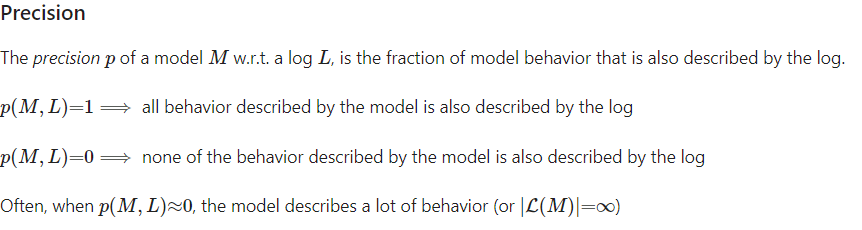

In [ ]:
#token_based_replay compared to orginal log
pm4py.precision_token_based_replay(reviewlog, p_net, pnet_im, pnet_fm)

replaying log with TBR, completed variants ::   0%|          | 0/22764 [00:00<?, ?it/s]

0.2085904798918602

In [ ]:
#alignments conmpared to original log
pm4py.precision_alignments(reviewlog, p_net, pnet_im, pnet_fm)

computing precision with alignments, completed variants ::   0%|          | 0/22764 [00:00<?, ?it/s]

0.4822862953010386

Diagnostics

In [ ]:
alignments = pm4py.conformance_diagnostics_alignments(reviewlog, p_net, pnet_im, pnet_fm)
alignments[0]

aligning log, completed variants ::   0%|          | 0/4118 [00:00<?, ?it/s]

{'alignment': [('>>', None),
  ('invite reviewers', 'invite reviewers'),
  ('>>', None),
  ('invite reviewers', 'invite reviewers'),
  ('>>', None),
  ('>>', None),
  ('>>', None),
  ('get review 3', 'get review 3'),
  ('get review 1', 'get review 1'),
  ('time-out 2', '>>'),
  ('collect reviews', '>>'),
  ('collect reviews', '>>'),
  ('>>', None),
  ('>>', None),
  ('decide', 'decide'),
  ('>>', None),
  ('decide', 'decide'),
  ('invite additional reviewer', '>>'),
  ('invite additional reviewer', '>>'),
  ('get review X', '>>'),
  ('>>', None),
  ('>>', None),
  ('reject', 'reject'),
  ('>>', None),
  ('reject', 'reject'),
  ('>>', None),
  ('>>', None)],
 'cost': 60013,
 'visited_states': 31,
 'queued_states': 86,
 'traversed_arcs': 89,
 'lp_solved': 9,
 'fitness': 0.6470588235294117,
 'bwc': 170008}

Generalization: analyse how the log and the process model match

In [ ]:
from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
generalization_evaluator.apply(reviewlog, p_net, pnet_im, pnet_fm)

replaying log with TBR, completed variants ::   0%|          | 0/4118 [00:00<?, ?it/s]

0.9873128719572248

Simplicity: the fourth dimension to analyse a process model. In this case, we define simplicity taking into account only the Petri net model. 

In [ ]:
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simplicity_evaluator.apply(p_net)

0.6969696969696969

### Statistics

In [ ]:
#case description
simple_ga_descritpion = duration_statistics_module.duration_statistics.cases_description(GA_model)
simple_ga_descritpion

{'1': {'startTime': 1136070000.0,
  'endTime': 1138402800.0,
  'caseDuration': 2332800.0},
 '10': {'startTime': 1139180400.0,
  'endTime': 1200524400.0,
  'caseDuration': 61344000.0},
 '100': {'startTime': 1175641200.0,
  'endTime': 2081026800.0,
  'caseDuration': 905385600.0},
 '1000': {'startTime': 1563231600.0,
  'endTime': 3840476400.0,
  'caseDuration': 2277244800.0},
 '10000': {'startTime': 5418054000.0,
  'endTime': 8505385200.0,
  'caseDuration': 3087331200.0},
 '1001': {'startTime': 1566342000.0,
  'endTime': 3416338800.0,
  'caseDuration': 1849996800.0},
 '1002': {'startTime': 1565650800.0,
  'endTime': 3982258800.0,
  'caseDuration': 2416608000.0},
 '1003': {'startTime': 1564700400.0,
  'endTime': 1671318000.0,
  'caseDuration': 106617600.0},
 '1004': {'startTime': 1561935600.0,
  'endTime': 4572457200.0,
  'caseDuration': 3010521600.0},
 '1005': {'startTime': 1565132400.0,
  'endTime': 3746991600.0,
  'caseDuration': 2181859200.0},
 '1006': {'startTime': 1562454000.0,
  'en

In [ ]:
# convert the case description to excel format to create a visualization of it
case_description_convert = pd.DataFrame.from_dict(simple_ga_descritpion)
case_description_convert

,1,10,100,1000,10000,1001,1002,1003,1004,1005,...,9990,9991,9992,9993,9994,9995,9996,9997,9998,9999
startTime,1.136070e+09,1.139180e+09,1.175641e+09,1.563232e+09,5.418054e+09,1.566342e+09,1.565651e+09,1.564700e+09,1.561936e+09,1.565132e+09,...,5.413993e+09,5.415030e+09,5.414425e+09,5.415116e+09,5.415808e+09,5.415721e+09,5.418659e+09,5.416672e+09,5.418486e+09,5.417622e+09
endTime,1.138403e+09,1.200524e+09,2.081027e+09,3.840476e+09,8.505385e+09,3.416339e+09,3.982259e+09,1.671318e+09,4.572457e+09,3.746992e+09,...,6.331475e+09,8.783939e+09,6.233152e+09,7.978086e+09,7.604233e+09,8.037529e+09,7.345292e+09,6.558016e+09,5.866643e+09,8.002969e+09
caseDuration,2.332800e+06,6.134400e+07,9.053856e+08,2.277245e+09,3.087331e+09,1.849997e+09,2.416608e+09,1.066176e+08,3.010522e+09,2.181859e+09,...,9.174816e+08,3.368909e+09,8.187264e+08,2.562970e+09,2.188426e+09,2.621808e+09,1.926634e+09,1.141344e+09,4.481568e+08,2.585347e+09


In [ ]:
# convert the case description to excel format to create a visualization of it
case_description_convert.to_excel("CUSTOM GENETIC review example case description.xlsx") 

In [ ]:
#Gets all the case durations out of the log
simple_ga_case_duration = duration_statistics_module.duration_statistics.all_case_duration(GA_model)
simple_ga_case_duration

[604800.0,
 604800.0,
 604800.0,
 777600.0,
 777600.0,
 950400.0,
 950400.0,
 950400.0,
 950400.0,
 950400.0,
 950400.0,
 1036800.0,
 1036800.0,
 1036800.0,
 1036800.0,
 1036800.0,
 1036800.0,
 1036800.0,
 1036800.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1209600.0,
 1209600.0,
 1209600.0,
 1209600.0,
 1209600.0,
 1209600.0,
 1209600.0,
 1209600.0,
 1209600.0,
 1209600.0,
 1209600.0,
 1296000.0,
 1296000.0,
 1296000.0,
 1296000.0,
 1296000.0,
 1296000.0,
 1296000.0,
 1296000.0,
 1296000.0,
 1296000.0,
 1296000.0,
 1296000.0,
 1382400.0,
 1382400.0,
 1382400.0,
 1382400.0,
 1382400.0,
 1382400.0,
 1382400.0,
 1382400.0,
 1382400.0,
 1382400.0,
 1382400.0,
 1382400.0,
 1382400.0,
 1382400.0,
 1382400.0,
 1382400.0,
 1382400.0,
 1382400.0,
 1382400.0,
 1382400.0,
 1382400.0,
 1468800.0,
 1468800.0,
 1468800.0,
 1468800.0,
 1468800.0,
 1468800.0,
 1468800.0,
 1468800.0,
 1468800.0,
 1468800.0,
 1468800.0,
 1468800.0,
 1468800.0,
 14

In [ ]:
sc = pd.DataFrame (simple_ga_case_duration, columns = ['days cases'])
sc['days cases'] = sc['days cases'] /86400
sc = sc.drop_duplicates()
sc.to_excel('custom genetic algorithm review example all_case_durationn.xlsx')

In [ ]:
simple_ga_median_case_duration = duration_statistics_module.duration_statistics.median_case_duration(GA_model)
print("Median case duration in second: ",simple_ga_median_case_duration, "second")
print("Median case duration in days: ",simple_ga_median_case_duration / 86400, "days")

Median case duration in second:  2654294400.0 second
Median case duration in days:  30721.0 days


### SNA

In [ ]:
social_network_analysis_module.sna.role_discovery(GA_model)

Activities: ['accept', 'invite reviewers', 'reject'] Originators importance {'Mike': 20030, 'Anne': 19970}
Activities: ['decide'] Originators importance {'Wil': 20000}
Activities: ['get review 1', 'get review 2', 'get review 3'] Originators importance {'Pam': 2168, 'John': 2126, 'Carol': 2118, 'Sara': 2146, 'Pete': 2172, 'Mary': 2132, 'Sam': 2107}


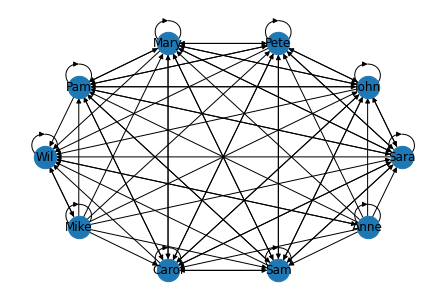

In [ ]:
handover_of_work = social_network_analysis_module.sna.handover_of_work(GA_model)

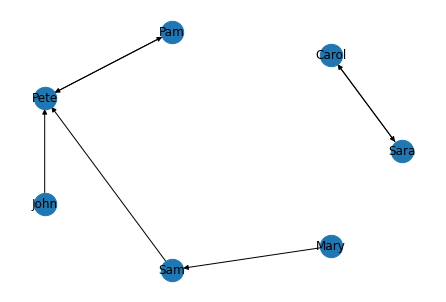

In [ ]:
subcontracting = social_network_analysis_module.sna.subcontracting(GA_model)

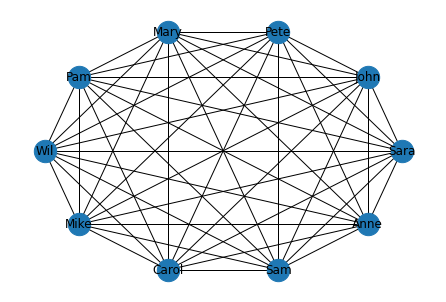

In [ ]:
working_together = social_network_analysis_module.sna.working_together(GA_model) 

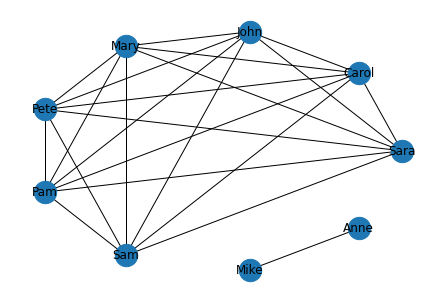

In [ ]:
similar_activities = social_network_analysis_module.sna.similar_activities(GA_model) 

In [ ]:
organizational_mining = social_network_analysis_module.sna.organizational_mining(GA_model) 


group_relative_focus
{'Mike': {'invite reviewers': 0.4975, 'get review 3': 0.0, 'get review 1': 0.0, 'decide': 0.0, 'reject': 0.5097323600973236, 'get review 2': 0.0, 'accept': 0.4984214680347277}, 'Mary': {'invite reviewers': 0.0, 'get review 3': 0.14037216828478966, 'get review 1': 0.1429140127388535, 'decide': 0.0, 'reject': 0.0, 'get review 2': 0.14397120575884823, 'accept': 0.0}, 'Pam': {'invite reviewers': 0.0, 'get review 3': 0.14826051779935276, 'get review 1': 0.14709394904458598, 'decide': 0.0, 'reject': 0.0, 'get review 2': 0.13917216556688664, 'accept': 0.0}, 'Wil': {'invite reviewers': 0.0, 'get review 3': 0.0, 'get review 1': 0.0, 'decide': 1.0, 'reject': 0.0, 'get review 2': 0.0, 'accept': 0.0}, 'Anne': {'invite reviewers': 0.5025, 'get review 3': 0.0, 'get review 1': 0.0, 'decide': 0.0, 'reject': 0.4902676399026764, 'get review 2': 0.0, 'accept': 0.5015785319652722}, 'Carol': {'invite reviewers': 0.0, 'get review 3': 0.13875404530744337, 'get review 1': 0.1453025477707

In [ ]:
clustering = social_network_analysis_module.sna.clustering(GA_model) 

clustered similar activities metric: {'3': ['Sara', 'John', 'Mary'], '0': ['Sam', 'Pam', 'Pete', 'Carol'], '1': ['Mike'], '2': ['Wil'], '4': ['Anne']}
 working together clustered metric: {'3': ['Sara', 'Sam', 'Pam', 'Mary'], '0': ['Pete', 'John', 'Carol'], '1': ['Mike'], '2': ['Wil'], '4': ['Anne']}


### EDA

<AxesSubplot: >

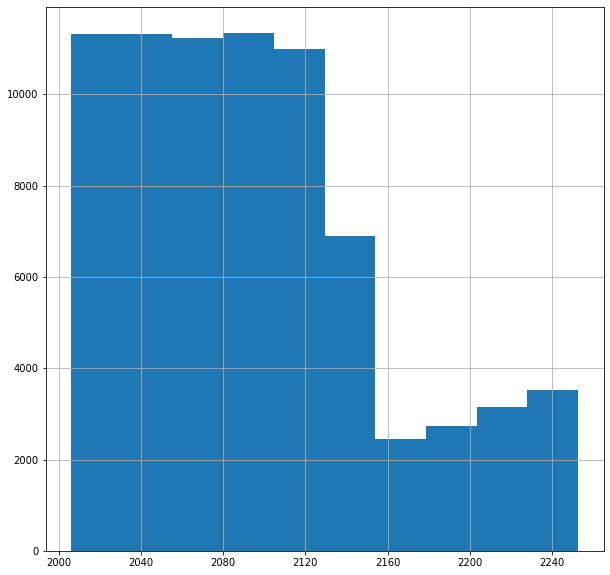

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,10))
GA_model_df['time:timestamp'].hist()

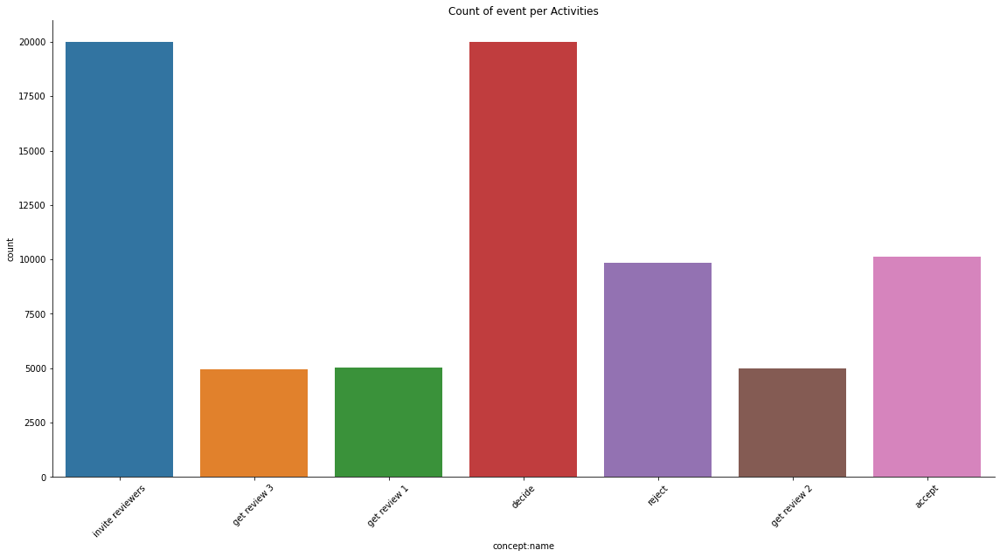

In [ ]:
fig = sns.catplot(x='concept:name', kind='count', data=GA_model_df, height=8, aspect=2)
plt.xticks(rotation=45)
plt.title('Count of event per Activities')
plt.show(fig)

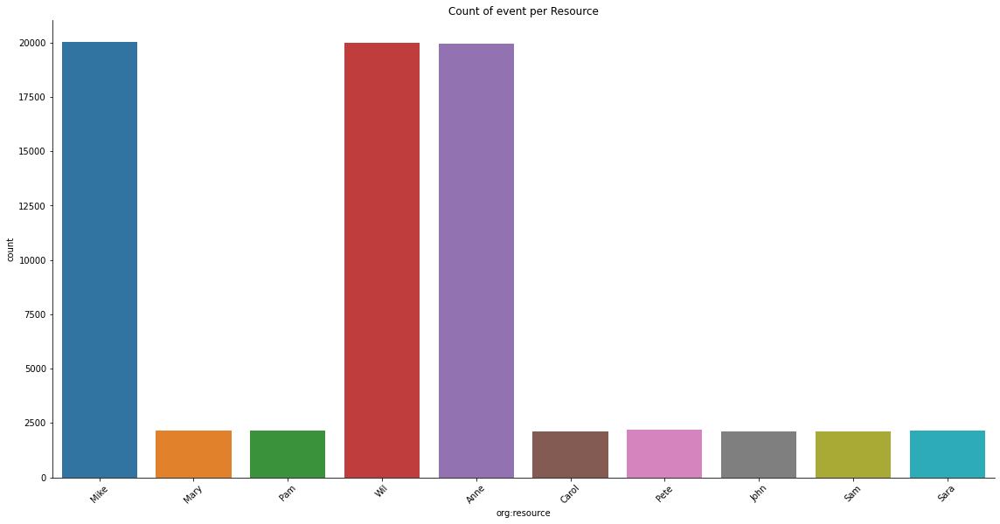

In [ ]:
fig = sns.catplot(x='org:resource', kind='count', data=GA_model_df, height=8, aspect=2)
plt.xticks(rotation=45)
plt.title('Count of event per Resource')
plt.show(fig)

In [ ]:
#ax=sns.countplot(x=GA_model_df['org:resource'],data=GA_model_df)

#ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")  #it will rotate text on x axis

#plt.tight_layout()
#plt.show()

In [ ]:
activities = pm4py.get_event_attribute_values(GA_model_df, "concept:name")
resources = pm4py.get_event_attribute_values(GA_model_df, "org:resource")

In [ ]:
activities

{'invite reviewers': 20000,
 'decide': 20000,
 'accept': 10136,
 'reject': 9864,
 'get review 1': 5024,
 'get review 2': 5001,
 'get review 3': 4944}

In [ ]:
resources

{'Mike': 20030,
 'Wil': 20000,
 'Anne': 19970,
 'Pete': 2172,
 'Pam': 2168,
 'Sara': 2146,
 'Mary': 2132,
 'John': 2126,
 'Carol': 2118,
 'Sam': 2107}

### VISPM https://github.com/AdamBanham/vispm

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[StaticDottedChartPresentor] Cleaning up plot... 
[StaticDottedChartPresentor] Plot is ready to show... 


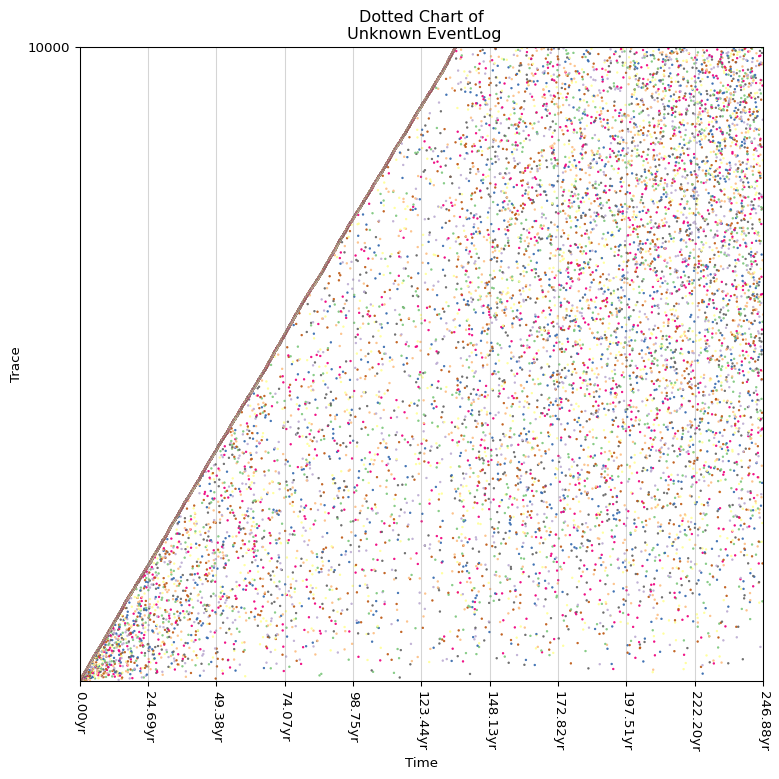

In [ ]:
# Static Presentors
from vispm import StaticDottedChartPresentor
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM,EARTH,COOL_WINTER,CATEGORICAL
from matplotlib import pyplot as plt

presentor = StaticDottedChartPresentor(GA_model)
presentor.plot()
plt.show()

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Added extension : DottedColourHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedColourHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedColourHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedColourHistogramExtension 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[DottedColourHistogramExtension] ploting histogram... 
[DottedColourHistogramExtension] ploting histogram... 
[DottedColourHistogramExtension] ploting histogram... 
[DottedColourHistogramExtension] ploting histogram... 
[StaticDottedChartPresentor] Cleaning up plot... 
[StaticDottedChartPresentor] Plot is ready to show... 


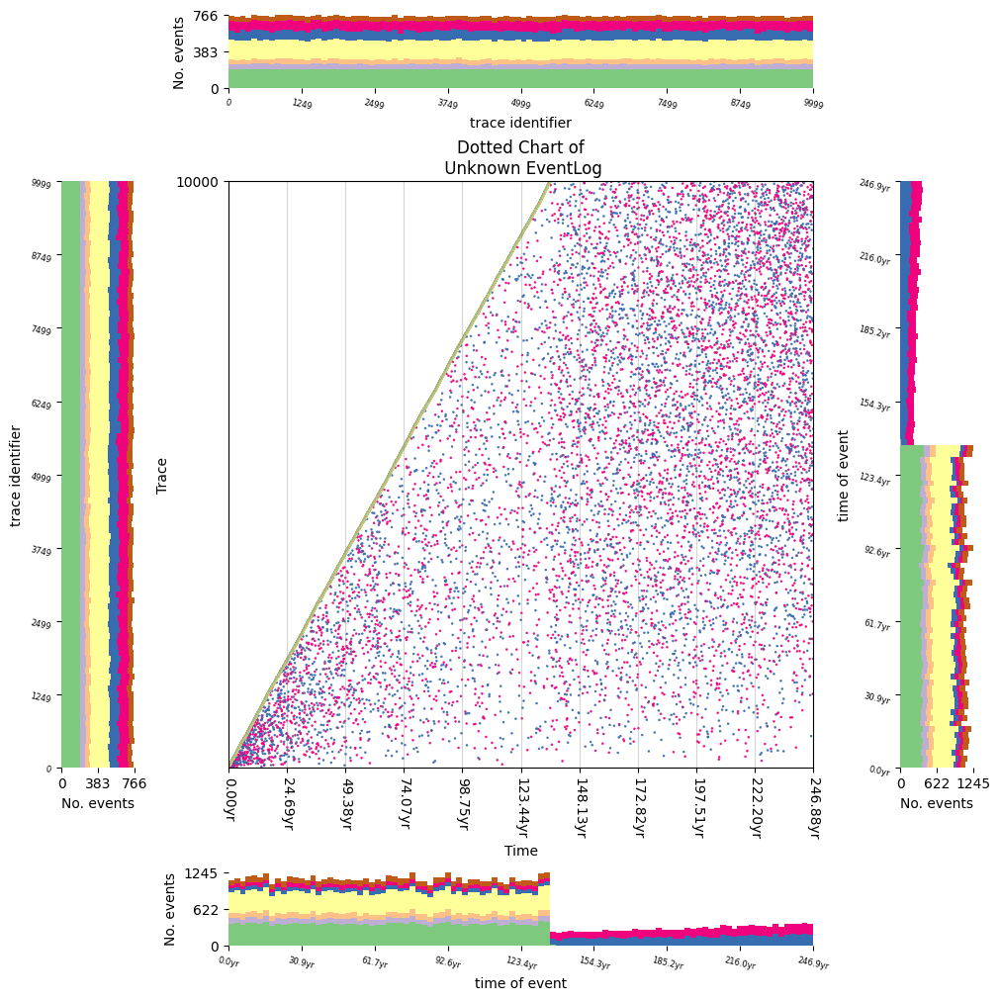

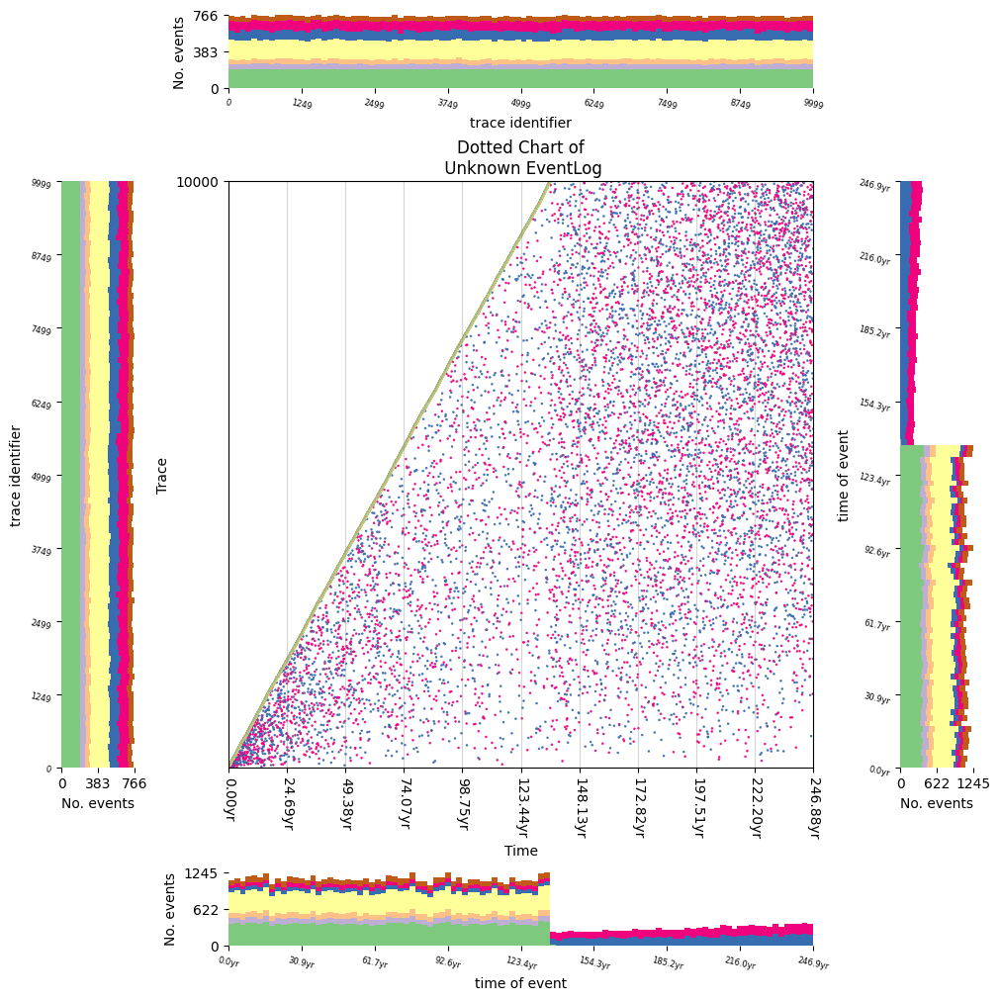

In [ ]:
# DottedColourHistogramExtension
#This extension plots a histogram based on the events within a dotted chart. Events will be broken down by colour for each bin.
from vispm import StaticDottedChartPresentor, DottedColourHistogramExtension
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM,EARTH,COOL_WINTER,CATEGORICAL


presentor = StaticDottedChartPresentor(GA_model,dpi=100,
    event_colour_scheme=StaticDottedChartPresentor.EventColourScheme.EventLabel,
    colormap=CATEGORICAL
)
ext = DottedColourHistogramExtension(direction=DottedColourHistogramExtension.Direction.NORTH)
presentor.add_extension(ext)
ext = DottedColourHistogramExtension(direction=DottedColourHistogramExtension.Direction.SOUTH,
         bin_axes=DottedColourHistogramExtension.PlotAxes.X)
presentor.add_extension(ext)
ext = DottedColourHistogramExtension(direction=DottedColourHistogramExtension.Direction.WEST)
presentor.add_extension(ext)
ext = DottedColourHistogramExtension(direction=DottedColourHistogramExtension.Direction.EAST,
         bin_axes=DottedColourHistogramExtension.PlotAxes.X)
presentor.add_extension(ext)
presentor.plot()

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[DottedEventHistogramExtension] ploting histogram... 
[DottedEventHistogramExtension] Event labels are imputed as :: {'invite reviewers': 'A', 'get review 2': 'B', 'get review 3': 'C', 'get review 1': 'D', 'decide': 'E', 'reject': 'F', 'accept': 'G'} 
[DottedEventHistogramExtension] ploting histogram... 
[DottedEventHistogramExtension] Event labels are imputed as :: {'invite reviewers': 'A', 'get 

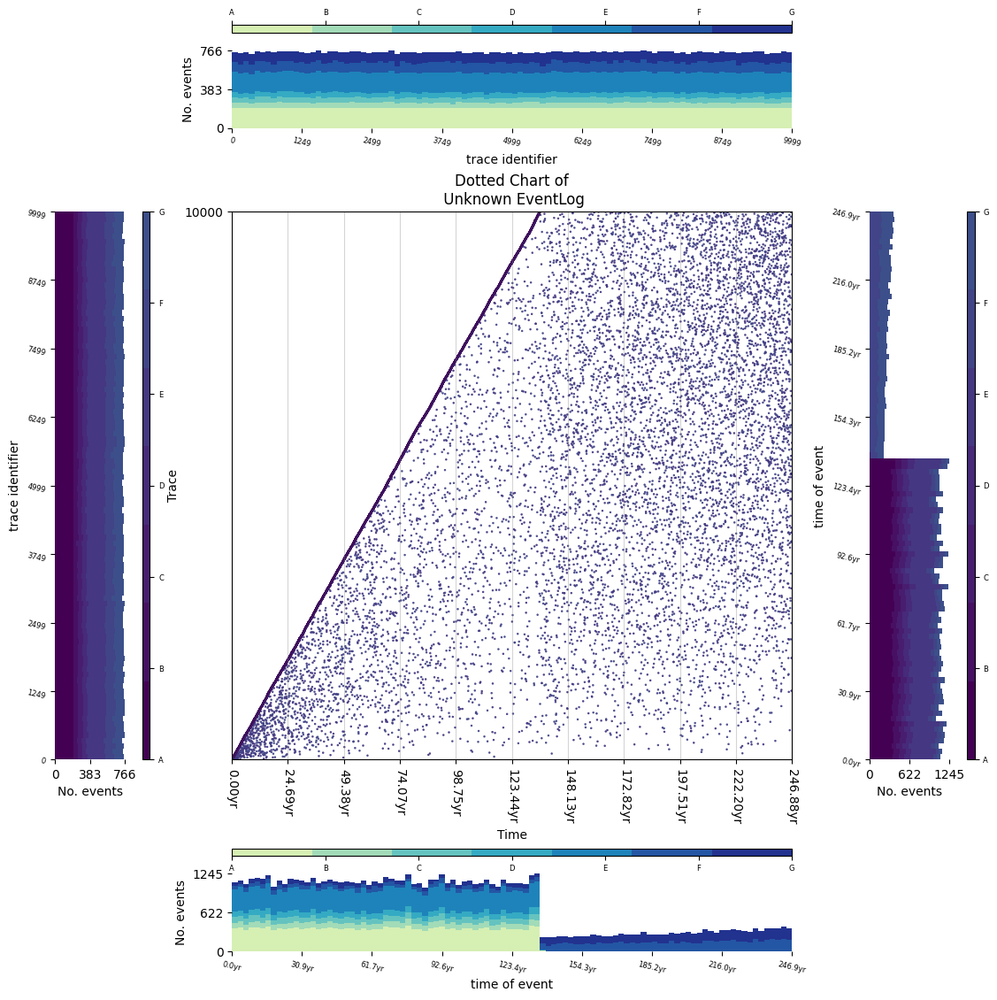

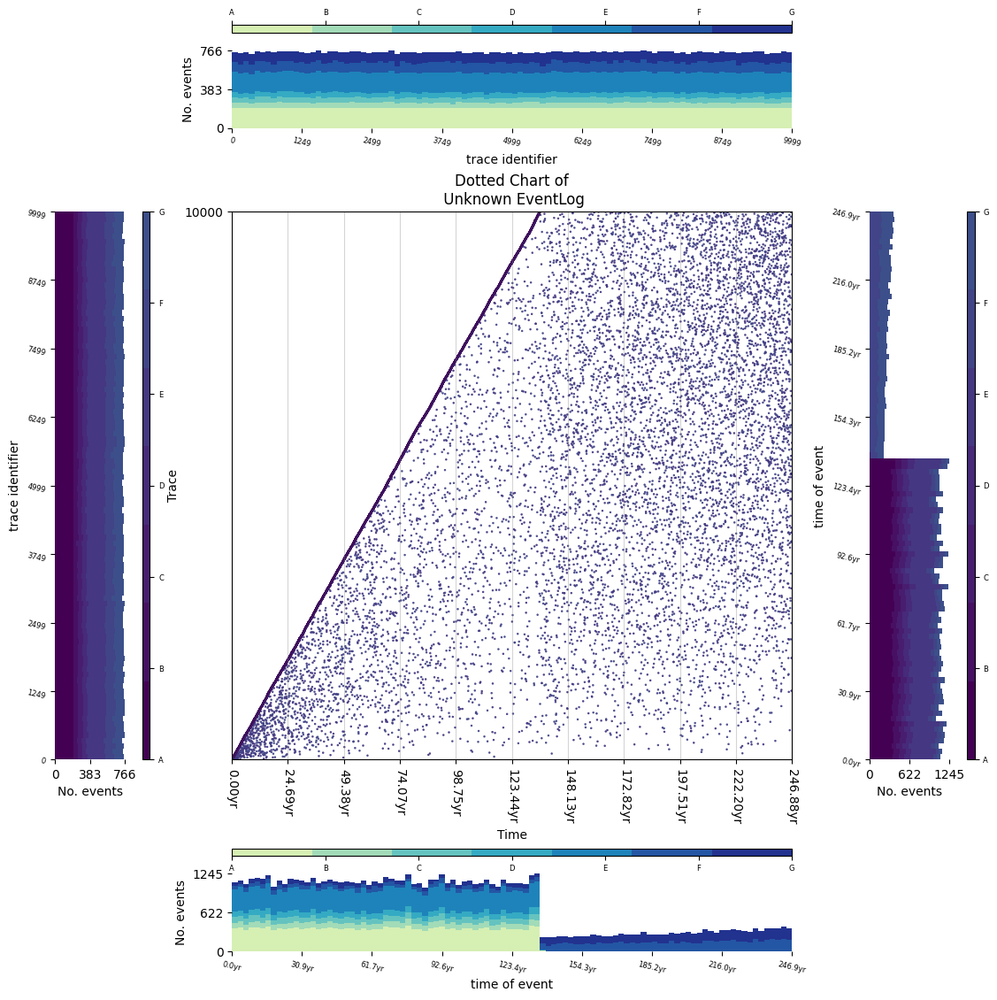

In [ ]:
# 1. setup up colour schemes to use
from vispm import StaticDottedChartPresentor, DottedColourHistogramExtension, DottedEventHistogramExtension
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM
from vispm.helpers.colours.colourmaps import EARTH,COOL_WINTER
from vispm import StaticDottedChartPresentor,DottedColourHistogramExtension

import numpy as np
from matplotlib.colors import ListedColormap
from matplotlib.cm import get_cmap

colourmaps = [COOL_WINTER,EARTH,HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM]
seq_colourmap = np.vstack(
    (
    colourmaps[0](np.linspace(0.20,1,8)),
    colourmaps[1](np.linspace(0.20,1,8)),
    colourmaps[2](np.linspace(0.20,1,8)),
    colourmaps[3](np.linspace(0.20,1,8))
    
    )
)
seq_colourmap = ListedColormap(seq_colourmap, name='VARIANCE')
cmap = get_cmap(HIGH_CONTRAST_COOL, 26)


# 2. create a presentor and add extensions
presentor = StaticDottedChartPresentor(GA_model,dpi=100,
    event_colour_scheme=StaticDottedChartPresentor.EventColourScheme.EventLabel,
    colormap=cmap
)

ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.SOUTH,
    bin_axes=DottedEventHistogramExtension.PlotAxes.X,
    colourmap=seq_colourmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.NORTH,
    bin_axes=DottedEventHistogramExtension.PlotAxes.Y,
    colourmap=seq_colourmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.WEST,
    bin_axes=DottedEventHistogramExtension.PlotAxes.Y,
    colourmap=cmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.EAST,
    bin_axes=DottedEventHistogramExtension.PlotAxes.X,
    colourmap=cmap
)
presentor.add_extension(ext)

presentor.plot()

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[DottedEventHistogramExtension] ploting histogram... 
[DottedEventHistogramExtension] Event labels are imputed as :: {'invite reviewers': 'A', 'get review 2': 'B', 'get review 3': 'C', 'get review 1': 'D', 'decide': 'E', 'reject': 'F', 'accept': 'G'} 
[DottedEventHistogramExtension] ploting histogram... 
[DottedEventHistogramExtension] Event labels are imputed as :: {'invite reviewers': 'A', 'get 

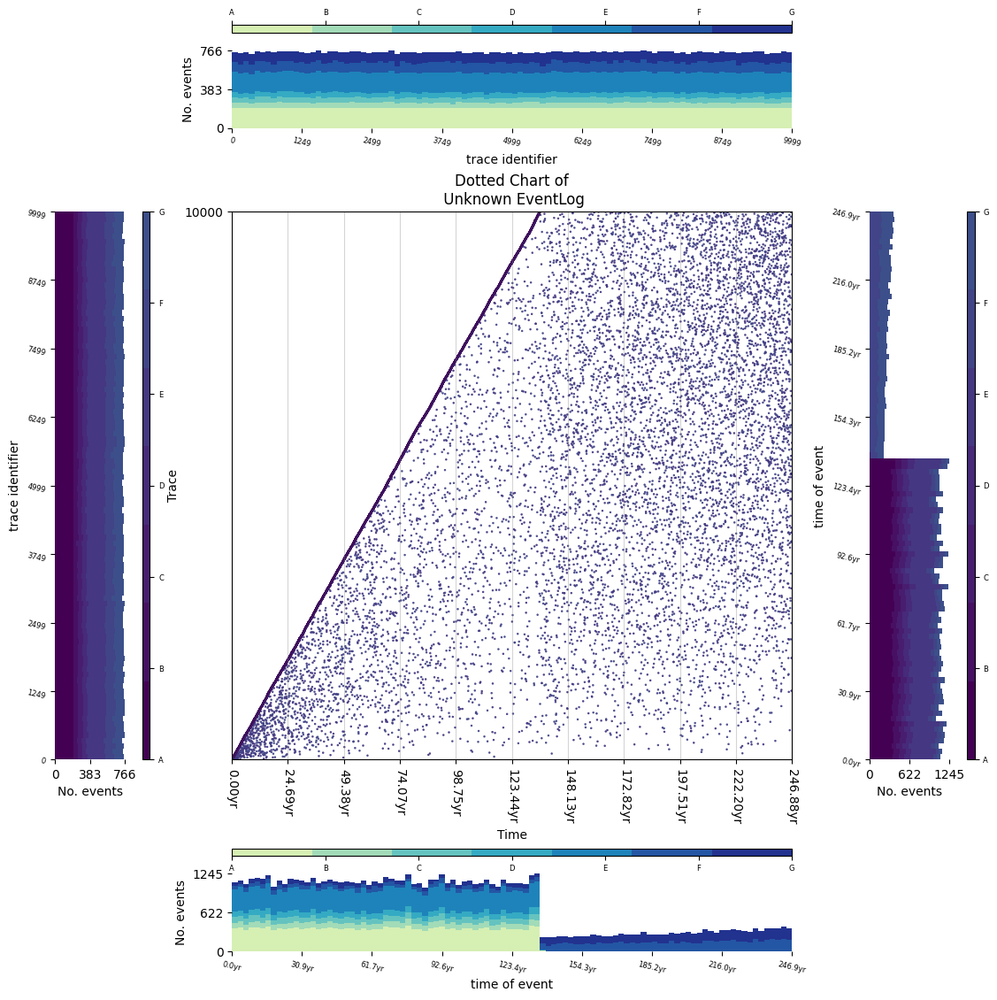

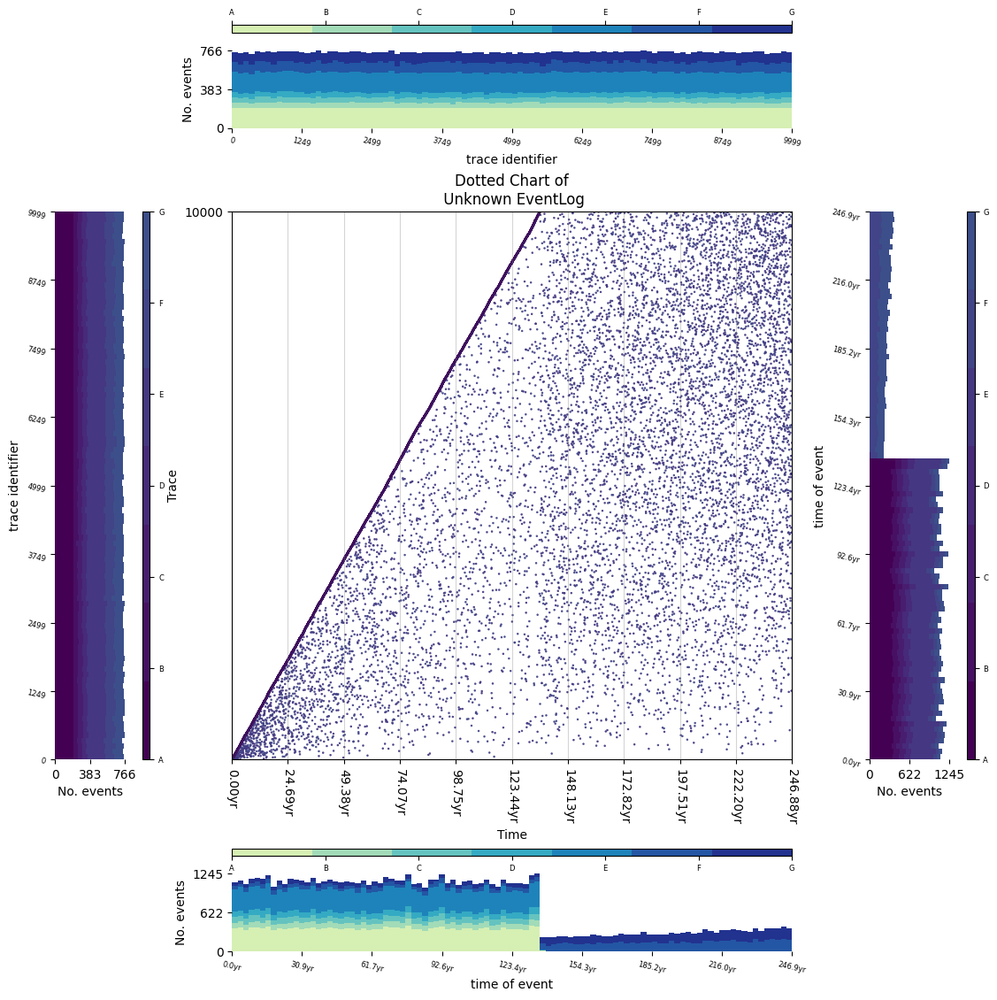

In [ ]:
# 1. setup up colour schemes to use
from vispm import StaticDottedChartPresentor, DottedColourHistogramExtension, DottedEventHistogramExtension
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM,EARTH,COOL_WINTER,CATEGORICAL
from vispm import StaticDottedChartPresentor,DottedColourHistogramExtension

import numpy as np
from matplotlib.colors import ListedColormap
from matplotlib.cm import get_cmap

colourmaps = [COOL_WINTER,EARTH,HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM, CATEGORICAL]
seq_colourmap = np.vstack(
    (
    colourmaps[0](np.linspace(0.20,1,8)),
    colourmaps[1](np.linspace(0.20,1,8)),
    colourmaps[2](np.linspace(0.20,1,8)),
    colourmaps[3](np.linspace(0.20,1,8)),
    colourmaps[4](np.linspace(0.20,1,8))
    
    )
)
seq_colourmap = ListedColormap(seq_colourmap, name='VARIANCE')
cmap = get_cmap(HIGH_CONTRAST_COOL, 26)


# 2. create a presentor and add extensions
presentor = StaticDottedChartPresentor(GA_model,dpi=100,
    event_colour_scheme=StaticDottedChartPresentor.EventColourScheme.EventLabel,
    colormap=cmap
)

ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.SOUTH,
    bin_axes=DottedEventHistogramExtension.PlotAxes.X,
    colourmap=seq_colourmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.NORTH,
    bin_axes=DottedEventHistogramExtension.PlotAxes.Y,
    colourmap=seq_colourmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.WEST,
    bin_axes=DottedEventHistogramExtension.PlotAxes.Y,
    colourmap=cmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.EAST,
    bin_axes=DottedEventHistogramExtension.PlotAxes.X,
    colourmap=cmap
)
presentor.add_extension(ext)

presentor.plot()

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Added extension : DescriptionHistogramExtension 
[StaticDottedChartPresentor] Added extension : DescriptionHistogramExtension 
[StaticDottedChartPresentor] Added extension : DescriptionHistogramExtension 
[StaticDottedChartPresentor] Added extension : DescriptionHistogramExtension 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[DescriptionHistogramExtension] plotting histogram 
[DescriptionHistogramExtension] Event labels are imputed as :: {'invite reviewers': 'A', 'get review 2': 'B', 'get review 3': 'C', 'get review 1': 'D', 'decide': 'E', 'reject': 'F', 'accept': 'G'} 
[DescriptionHistogramExtension] plotting histogram 
[DescriptionHistogramExtension] plotting histogram 
[DescriptionHistogramExtension] plotting histo

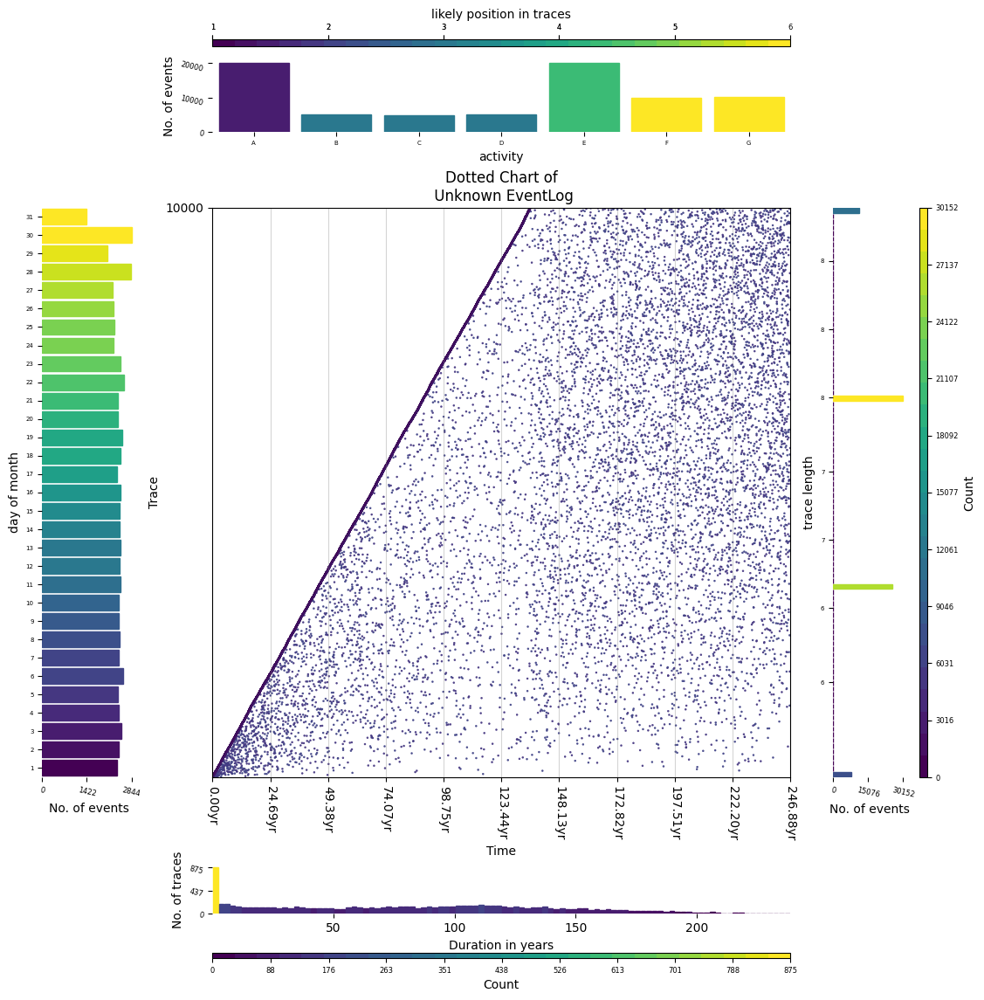

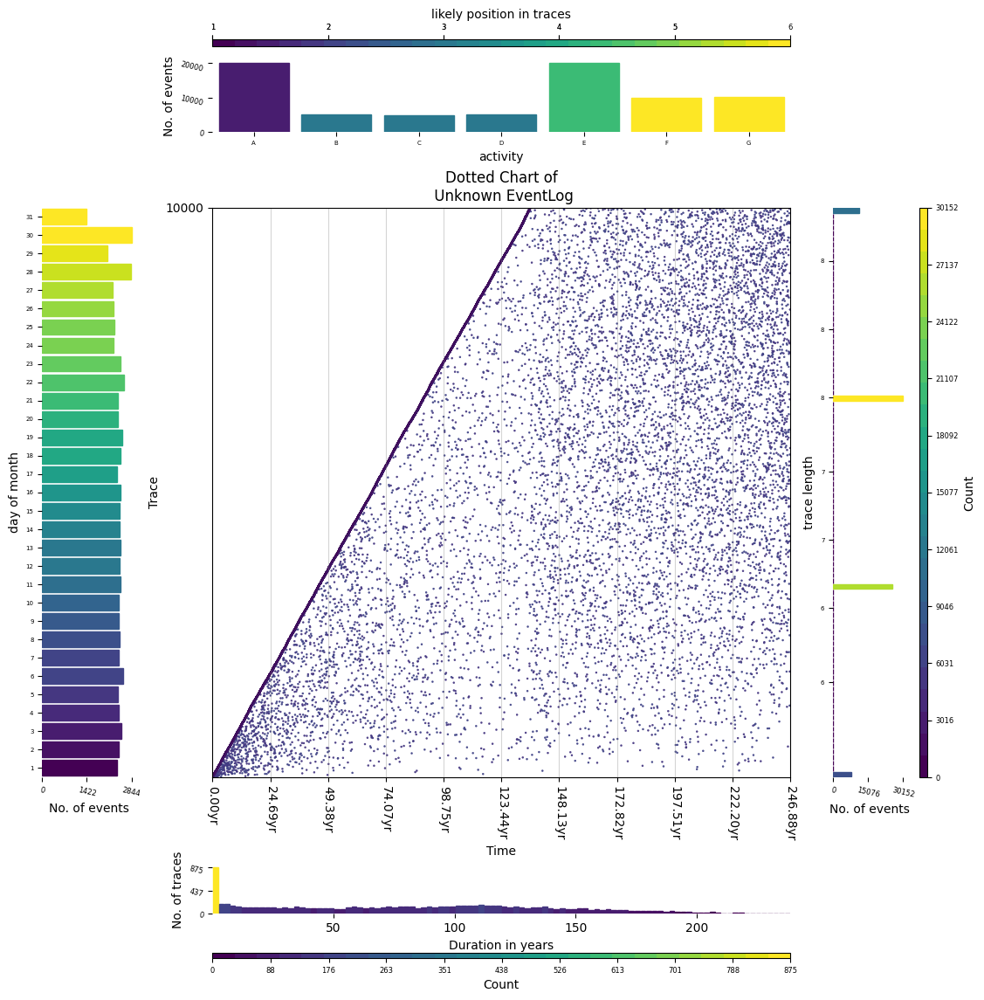

In [ ]:
#DescriptionHistogramExtension
#This extension describes an aspect of the event log.
# For example, a breakdown of trace duration, or trace length (by the number of activities), or event label, or when events occur (weekday or monthday).

#The following example shows how to use this extension to understand the properties of event log, alongside a dotted chart.


from vispm import DescriptionHistogramExtension
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM,EARTH,COOL_WINTER,CATEGORICAL
from vispm import StaticDottedChartPresentor,DottedColourHistogramExtension


cmap = get_cmap(HIGH_CONTRAST_COOL, 26)
presentor = StaticDottedChartPresentor(GA_model,dpi=100,
    event_colour_scheme=StaticDottedChartPresentor.EventColourScheme.EventLabel,
    colormap=cmap
)

ext = DescriptionHistogramExtension(
)
presentor.add_extension(ext)

ext = DescriptionHistogramExtension(
    direction=DescriptionHistogramExtension.Direction.EAST,
    describe=DescriptionHistogramExtension.Describe.TraceLength,
    density=DescriptionHistogramExtension.Density.Event
)
presentor.add_extension(ext)

ext = DescriptionHistogramExtension(
    direction=DescriptionHistogramExtension.Direction.SOUTH,
    describe=DescriptionHistogramExtension.Describe.TraceDuration,
    density=DescriptionHistogramExtension.Density.Trace
)
presentor.add_extension(ext)

ext = DescriptionHistogramExtension(
    direction=DescriptionHistogramExtension.Direction.WEST,
    describe=DescriptionHistogramExtension.Describe.Monthday,
    density=DescriptionHistogramExtension.Density.Event
)
presentor.add_extension(ext)

presentor.plot()

# Help Desk

In [ ]:
#Activities = namedtuple( 'Activities', ['name','aggregated_max_relative_day', 'weight'])
Helpdesk_activities = namedtuple( 'Helpdesk_activities', ['name','days_to_finish', 'percentage'])

max_days = 257

things = [ 
    
          
          Helpdesk_activities('Insert Ticket',0 , 0),
          Helpdesk_activities('Assign Seriousness',44 , 24),
          Helpdesk_activities('Take in charge ticket',48 , 24),
          Helpdesk_activities('Schedule intervention',11 , 0),
          Helpdesk_activities('Create SW anomaly',55 , 0),
          Helpdesk_activities('Resolve SW anomaly',37 , 0),
          Helpdesk_activities('Wait',48 , 7),
          Helpdesk_activities('Require upgrade',55 , 1),
          Helpdesk_activities('Resolve ticket',58 , 23),
          Helpdesk_activities('RESOLVED' ,34 , 0),
          Helpdesk_activities('INVALID',34 , 0),
          Helpdesk_activities('VERIFIED',56 , 0),
          Helpdesk_activities('DUPLICATE',7 , 0),
          Helpdesk_activities('Closed',59 , 21),
        ]

In [ ]:
def generate_genome(length: int) -> Genome:
    return choices([0, 1], k=length)

In [ ]:
def generate_population(size: int, genome_length: int) -> Population:
    return [generate_genome(genome_length) for _ in range(size)]  

In [ ]:
def fitness(genome: Genome, things: List[Helpdesk_activities], percentage_limit: int) -> int:
  if len(genome) != len(things):
    raise ValueError( "genome and Helpdesk_activities must be the same length")
  
  percentage = 0
  days_to_finish = 0

  for i, Helpdesk_activities in enumerate(things):
    if genome[i] == 1:
      percentage += Helpdesk_activities.percentage
      days_to_finish += Helpdesk_activities.days_to_finish
      
    if percentage > percentage_limit:
      return 0

  return days_to_finish 


In [ ]:
def selection_pair(population: Population, fitness_func: FitnessFunc) -> Population:
    return choices(
        population = population,
        percentages = [fitness_func(gene) for gene in population],
        k=2
    )


In [ ]:
def single_point_crossover(a: Genome, b: Genome) -> Tuple[Genome, Genome]:
  if len(a) != len(b):
    raise ValueError("Genome a and b must be of the same length")
  
  length = len(a)
  if length < 2:
    return a,b

  
  p = randint(1, length -1)
  return a[0:p] + b[p:], b[0:p], a[p:]

In [ ]:
def mutation(genome: Genome, num: int = 1, probability: float = 0.5) -> Genome:
    for _ in range(num):
        index = randrange(len(genome))
        genome[index] = genome[index] if random() > probability else abs(genome[index] - 1)
    return genome

In [ ]:
def run_evolution(
      populate_func: PopulateFunc,
      fitness_func: FitnessFunc,
      fitness_limit: int,
      selection_func: SelectionFunc = selection_pair,
      crossover_func: CrossoverFunc = single_point_crossover,
      mutation_func: MutationFunc = mutation,
      generation_limit: int = 100) -> Tuple[Population, int]:

    population = populate_func()

    for i in range(generation_limit):
      population = sorted(population, key=lambda genome: fitness_func(genome), reverse=True)

      if fitness_func(population[0]) >= fitness_limit:
        break
      
      next_generation = population[0:2]

      for j in range(int(len(population) / 2) - 1):
        parents = selection_func(population, fitness_func)
        offspring_a, offspring_b = crossover_func(parents[0], parents[1])
        offspring_a = mutation_func(offspring_a)
        offspring_b = mutation_func(offspring_b)
        next_generation += [offspring_a, offspring_b]

      population = next_generation

    population = sorted(population, key=lambda genome: fitness_func(genome),reverse=True)
    return population, i

In [ ]:
import time
from functools import partial

In [ ]:
start = time.time()

population, generations = run_evolution(
    populate_func= partial(generate_population, size=14, genome_length=len(things)),                         
    fitness_func= partial(fitness, things=things, percentage_limit= 100),
    fitness_limit = 100,
    generation_limit= 1000) 

end = time.time()

In [ ]:
def genome_to_things(genome: Genome, things: List[Helpdesk_activities]) -> List[Helpdesk_activities]:
  result = []
  for i, Helpdesk_activities in enumerate(things):
    if genome[i] == 1:
      result += [Helpdesk_activities.name]
  return result

In [ ]:
print(f"number of generations: {generations}")
print(f"time: {end - start}s")
print(f"best solution: {genome_to_things(population[0], things)}")

number of generations: 0
time: 0.0004467964172363281s
best solution: ['Assign Seriousness', 'Take in charge ticket', 'Create SW anomaly', 'Wait', 'Require upgrade', 'RESOLVED', 'INVALID', 'VERIFIED', 'Closed']


## Simple Genetic Algorithm Model Helpdesk

In [3]:
review_example_log = pm4py.read_xes('/content/drive/MyDrive/Abou Keita - Capstone 606/Datasets/cleaned_HelpDesk_log.xes')
reviewlog = pm4py.convert_to_event_log(review_example_log)

parsing log, completed traces ::   0%|          | 0/4580 [00:00<?, ?it/s]

/usr/local/lib/python3.8/dist-packages/pm4py/utils.py:486: UserWarning: the EventLog class has been deprecated and will be removed in a future release.
  warnings.warn("the EventLog class has been deprecated and will be removed in a future release.")


In [4]:
#drop the columns not part of the fitness
rows= ['Assign Seriousness', 'Take in charge ticket', 'Create SW anomaly', 'Wait', 'Require upgrade', 'RESOLVED', 'INVALID', 'VERIFIED', 'Closed']
GA_model_df =review_example_log[review_example_log['concept:name'].isin(rows)]


In [5]:
GA_model = pm4py.convert_to_event_log(GA_model_df)

/usr/local/lib/python3.8/dist-packages/pm4py/utils.py:486: UserWarning: the EventLog class has been deprecated and will be removed in a future release.
  warnings.warn("the EventLog class has been deprecated and will be removed in a future release.")


BPMN Model

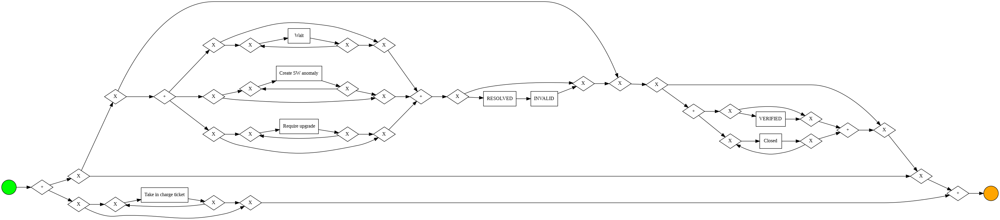

In [ ]:
cp_bpmn_model = pm4py.discover_bpmn_inductive(GA_model)
pm4py.view_bpmn(cp_bpmn_model)

dfg model

<ipython-input-44-76b93a604bd5>:1: DeprecatedWarning: discover_dfg is deprecated as of 2.3.0 and will be removed in 2.4.0. this method will be replaced by the discover_dfg_typed function(). Please adapt your code to use pm4py.discover_dfg_typed()
  cpdfg, cp_start_activities, cp_end_activities = pm4py.discover_dfg(GA_model)


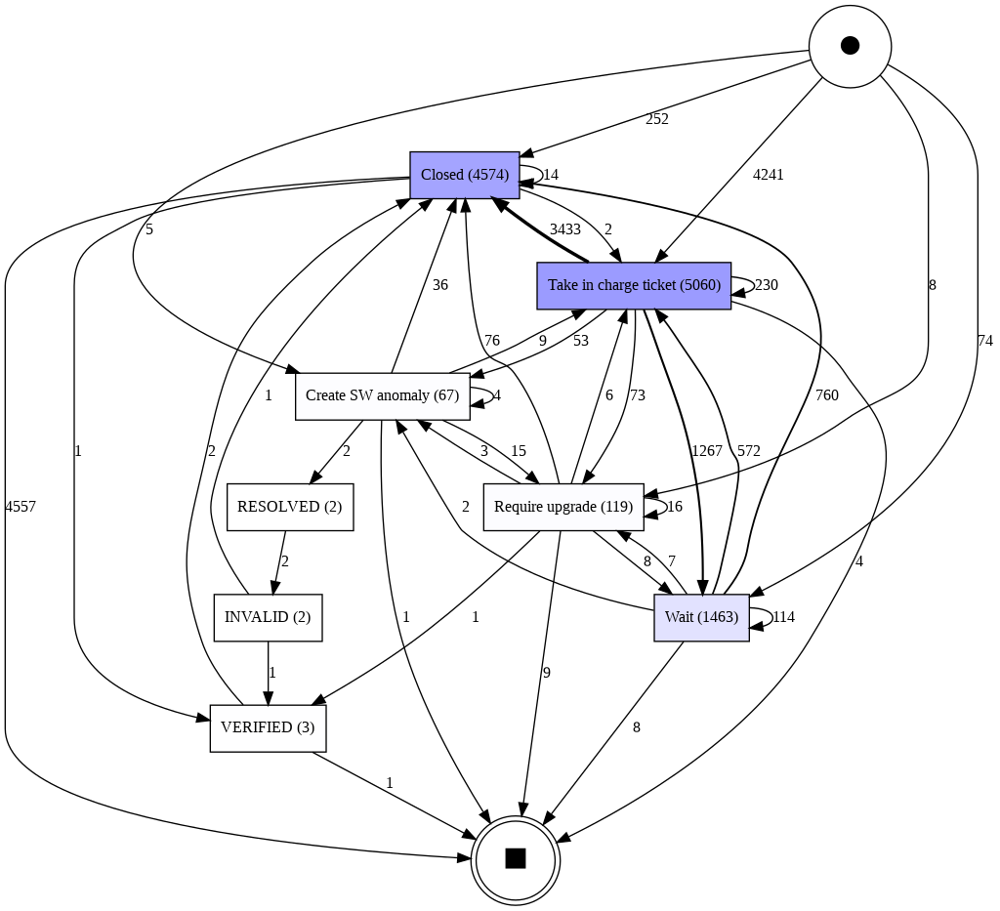

In [ ]:
cpdfg, cp_start_activities, cp_end_activities = pm4py.discover_dfg(GA_model)
pm4py.view_dfg(cpdfg, cp_start_activities, cp_end_activities)

heuritic miner model

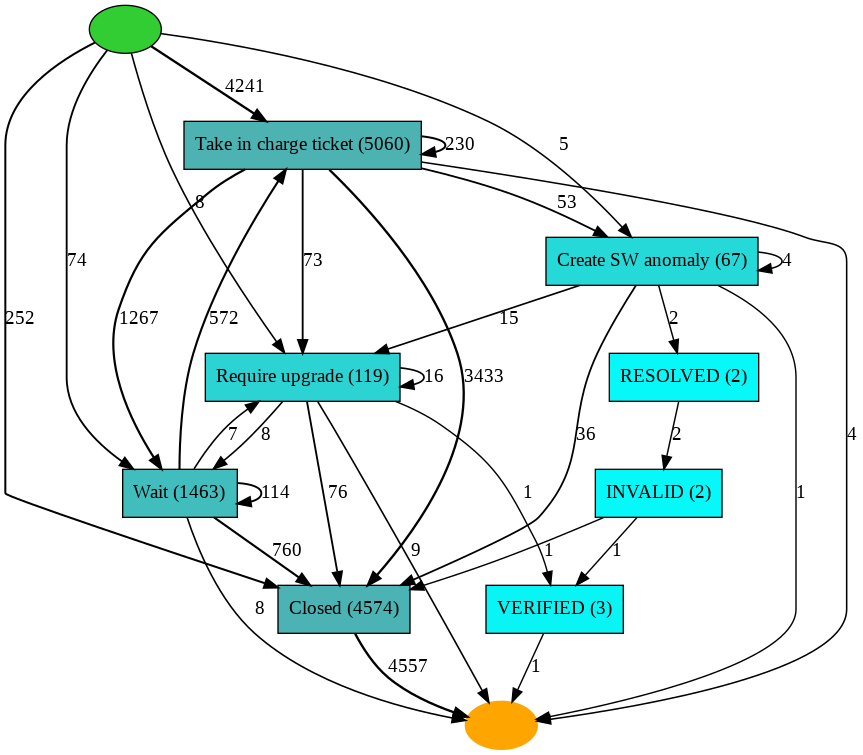

In [ ]:
#show the heuritic miner model
cp_map = pm4py.discover_heuristics_net(GA_model)
pm4py.view_heuristics_net(cp_map)

In [ ]:
# number of event in the cpm event log
num_event = len(GA_model_df)
num_cases = len(GA_model_df['case:concept:name'].unique())
print("number of event: {} \n Number of unique cases: {}".format(num_event, num_cases))
ppl_invovled = GA_model_df['org:resource'].unique()
num_ppl_invovled = len(GA_model_df['org:resource'].unique())
print("The resources or people invovled are: {} \n The number of resources are: {}".format(ppl_invovled, num_ppl_invovled))

number of event: 11290 
 Number of unique cases: 4580
The resources or people invovled are: ['Angelica Smith' 'James Rogers' 'Bradley Acosta' 'Ricardo Parker'
 'Megan Ortiz' 'Nicholas Fowler' 'Martin Burton' 'Kristin Burton'
 'Wendy Thompson' 'James Cole' 'Linda Brooks' 'Jennifer Young'
 'John Nichols' 'Kelly Williams' 'Alex Haley' 'Donna Pearson'
 'Omar Collins' 'Michelle Glenn' 'Angela Kirk' 'Mark Valencia'
 'Richard Perry' 'Olivia Henry'] 
 The number of resources are: 22


### Model Evaluation - Conformance checking

Conformance checking techniques compare a process model with an event log of the same process. The goal is to check if the event log conforms to the model, and, vice versa. Only works with Petri Net models
- https://pm4py.fit.fraunhofer.de/static/assets/api/2.3.0/apihtml#conformance-checking-pm4py-conformance

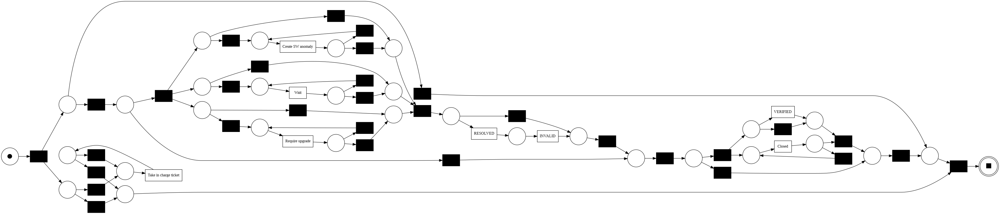

In [ ]:
# conversion to petri net
p_net, pnet_im, pnet_fm = pm4py.convert_to_petri_net(cp_bpmn_model)
pm4py.view_petri_net(p_net, pnet_im, pnet_fm)

Soundness

In [ ]:
#Checking Behavioral Model Properties
pm4py.check_soundness(p_net, pnet_im, pnet_fm)

#from pm4py.algo.analysis.woflan import algorithm as woflan
#is_sound = woflan.apply(p_net, pnet_im, pnet_fm, parameters={woflan.Parameters.RETURN_ASAP_WHEN_NOT_SOUND: False,
#                                                     woflan.Parameters.PRINT_DIAGNOSTICS: True,
#                                                     woflan.Parameters.RETURN_DIAGNOSTICS: False})

Input is ok.
Petri Net is a workflow net.


/usr/local/lib/python3.8/dist-packages/pm4py/util/lp/variants/scipy_solver.py:26: OptimizeWarning: A_eq does not appear to be of full row rank. To improve performance, check the problem formulation for redundant equality constraints.
  sol = linprog(c, A_ub=Aub, b_ub=bub, A_eq=Aeq, b_eq=beq, method="revised simplex")


Every place is covered by s-components.
There are no dead tasks.
All tasks are live.


True

Replay Fitness

The fitness  of an event log  w.r.t. a model  is the fraction of log behavior that is described by the model.

 1 = all behavior described by the event log is also described by the model

 0 = none of the behavior described by the event log is also described by the mode

 - For token-based replay, the percentage of traces that are completely fit is returned, along with a fitness value that is calculated.
 - For alignments, the percentage of traces that are completely fit is returned, along with a fitness value that is calculated as the average of the fitness values of the single traces.

In [ ]:
#token_based_replay compared to orginal log
pm4py.fitness_token_based_replay(reviewlog, p_net, pnet_im, pnet_fm)

replaying log with TBR, completed variants ::   0%|          | 0/226 [00:00<?, ?it/s]

{'perc_fit_traces': 100.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 1.0,
 'percentage_of_fitting_traces': 100.0}

In [ ]:
#alignments conmpared to original log
alignments_fitness = pm4py.fitness_alignments(reviewlog, p_net, pnet_im, pnet_fm)
alignments_fitness

aligning log, completed variants ::   0%|          | 0/226 [00:00<?, ?it/s]

{'percFitTraces': 0.0,
 'averageFitness': 0.5171771932579776,
 'percentage_of_fitting_traces': 0.0,
 'average_trace_fitness': 0.5171771932579776,
 'log_fitness': 0.5286118082802713}

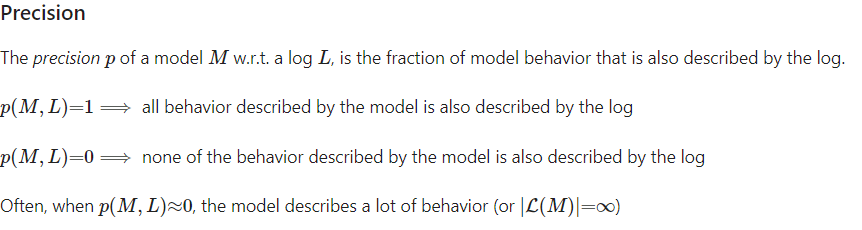

In [ ]:
#token_based_replay compared to orginal log
pm4py.precision_token_based_replay(reviewlog, p_net, pnet_im, pnet_fm)

replaying log with TBR, completed variants ::   0%|          | 0/500 [00:00<?, ?it/s]

0.48795741273722704

In [ ]:
#alignments conmpared to original log
pm4py.precision_alignments(reviewlog, p_net, pnet_im, pnet_fm)

computing precision with alignments, completed variants ::   0%|          | 0/500 [00:00<?, ?it/s]

0.42588070089749064

Diagnostics

In [ ]:
alignments = pm4py.conformance_diagnostics_alignments(reviewlog, p_net, pnet_im, pnet_fm)
alignments[0]

aligning log, completed variants ::   0%|          | 0/226 [00:00<?, ?it/s]

{'alignment': [('Assign seriousness', '>>'),
  ('>>', None),
  ('>>', None),
  ('Take in charge ticket', 'Take in charge ticket'),
  ('>>', None),
  ('Take in charge ticket', 'Take in charge ticket'),
  ('Resolve ticket', '>>'),
  ('>>', None),
  ('>>', None),
  ('>>', None),
  ('>>', None),
  ('>>', None),
  ('>>', None),
  ('Closed', 'Closed'),
  ('>>', None),
  ('>>', None),
  ('>>', None)],
 'cost': 20012,
 'visited_states': 90,
 'queued_states': 193,
 'traversed_arcs': 298,
 'lp_solved': 90,
 'fitness': 0.6,
 'bwc': 50004}

Generalization: analyse how the log and the process model match

In [ ]:
from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
generalization_evaluator.apply(reviewlog, p_net, pnet_im, pnet_fm)

replaying log with TBR, completed variants ::   0%|          | 0/226 [00:00<?, ?it/s]

0.8716801389878392

Simplicity: the fourth dimension to analyse a process model. In this case, we define simplicity taking into account only the Petri net model. 

In [ ]:
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simplicity_evaluator.apply(p_net)

0.6761904761904762

### Statistics

In [11]:
#case description
simple_ga_descritpion = duration_statistics_module.duration_statistics.cases_description(GA_model)
simple_ga_descritpion

{'Case1': {'startTime': 1349783461.0,
  'endTime': 1352458479.0,
  'caseDuration': 2675018.0},
 'Case10': {'startTime': 1268981226.0,
  'endTime': 1270270058.0,
  'caseDuration': 1288832.0},
 'Case100': {'startTime': 1366788241.0,
  'endTime': 1369909280.0,
  'caseDuration': 3121039.0},
 'Case1000': {'startTime': 1264056820.0,
  'endTime': 1267858857.0,
  'caseDuration': 3802037.0},
 'Case1001': {'startTime': 1364191713.0,
  'endTime': 1365748296.0,
  'caseDuration': 1556583.0},
 'Case1002': {'startTime': 1282883685.0,
  'endTime': 1285400432.0,
  'caseDuration': 2516747.0},
 'Case1003': {'startTime': 1294725350.0,
  'endTime': 1296809960.0,
  'caseDuration': 2084610.0},
 'Case1004': {'startTime': 1317016325.0,
  'endTime': 1319256649.0,
  'caseDuration': 2240324.0},
 'Case1005': {'startTime': 1293000550.0,
  'endTime': 1298011243.0,
  'caseDuration': 5010693.0},
 'Case1006': {'startTime': 1264151391.0,
  'endTime': 1268298633.0,
  'caseDuration': 4147242.0},
 'Case1007': {'startTime':

In [12]:
# convert the case description to excel format to create a visualization of it
case_description_convert = pd.DataFrame.from_dict(simple_ga_descritpion)
case_description_convert
# convert the case description to excel format to create a visualization of it
case_description_convert.to_excel("custom ga helpdesk case description.xlsx") 

In [13]:
#Gets all the case durations out of the log
simple_ga_case_duration = duration_statistics_module.duration_statistics.all_case_duration(GA_model)
simple_ga_case_duration

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0

In [14]:
sc = pd.DataFrame (simple_ga_case_duration, columns = ['days cases'])
sc['days cases'] = sc['days cases'] /86400
sc = sc.drop_duplicates()
sc.to_excel('custom ga helpdesk all_case_durationn.xlsx')

In [15]:
simple_ga_median_case_duration = duration_statistics_module.duration_statistics.median_case_duration(GA_model)
print("Median case duration in second: ",simple_ga_median_case_duration, "second")
print("Median case duration in days: ",simple_ga_median_case_duration / 86400, "days")

Median case duration in second:  3025551.0 second
Median case duration in days:  35.01795138888889 days


### SNA

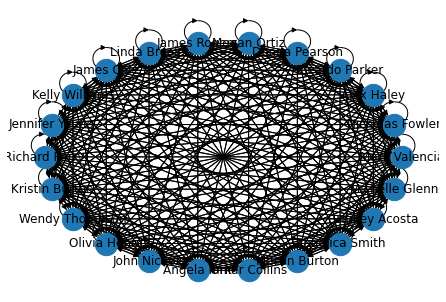

In [ ]:
handover_of_work = social_network_analysis_module.sna.handover_of_work(GA_model)

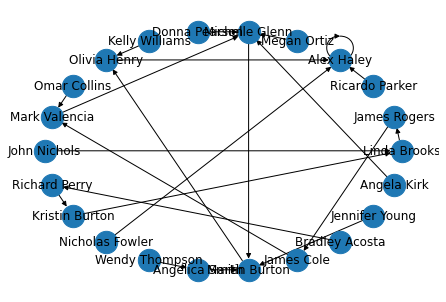

In [ ]:
subcontracting = social_network_analysis_module.sna.subcontracting(GA_model)

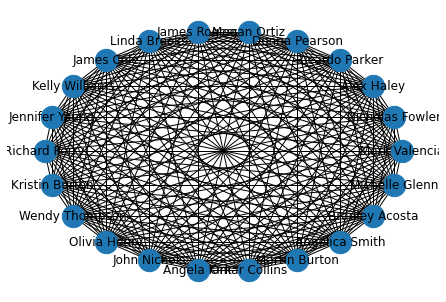

In [ ]:
working_together = social_network_analysis_module.sna.working_together(GA_model) 

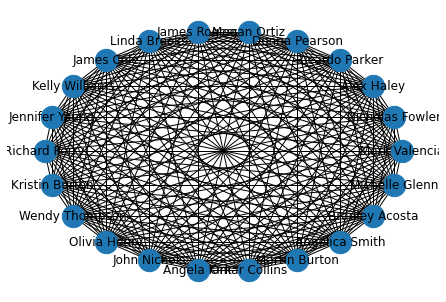

In [ ]:
similar_activities = social_network_analysis_module.sna.similar_activities(GA_model) 

In [ ]:
organizational_mining = social_network_analysis_module.sna.organizational_mining(GA_model) 


group_relative_focus
{'Angelica Smith': {'Take in charge ticket': 0.0458498023715415, 'Closed': 0.04459991254919108, 'Wait': 0.0430622009569378, 'Create SW anomaly': 0.05970149253731343, 'Require upgrade': 0.058823529411764705, 'VERIFIED': 0.0, 'RESOLVED': 0.0, 'INVALID': 0.0}, 'James Rogers': {'Take in charge ticket': 0.04426877470355731, 'Closed': 0.047879317883690424, 'Wait': 0.047163362952836636, 'Create SW anomaly': 0.029850746268656716, 'Require upgrade': 0.058823529411764705, 'VERIFIED': 0.0, 'RESOLVED': 0.0, 'INVALID': 0.0}, 'Bradley Acosta': {'Take in charge ticket': 0.04110671936758893, 'Closed': 0.045474420638390904, 'Wait': 0.048530416951469584, 'Create SW anomaly': 0.05970149253731343, 'Require upgrade': 0.025210084033613446, 'VERIFIED': 0.0, 'RESOLVED': 0.0, 'INVALID': 0.0}, 'Ricardo Parker': {'Take in charge ticket': 0.04762845849802372, 'Closed': 0.045693047660690864, 'Wait': 0.04032809295967191, 'Create SW anomaly': 0.029850746268656716, 'Require upgrade': 0.042016806

In [ ]:
clustering = social_network_analysis_module.sna.clustering(GA_model) 

clustered similar activities metric: {'0': ['Angelica Smith', 'Donna Pearson', 'Martin Burton', 'Michelle Glenn', 'Ricardo Parker', 'Nicholas Fowler', 'Angela Kirk', 'Alex Haley', 'Wendy Thompson', 'Richard Perry', 'Linda Brooks', 'Kelly Williams', 'Omar Collins', 'Mark Valencia', 'James Cole'], '1': ['Olivia Henry', 'Megan Ortiz', 'Jennifer Young', 'Kristin Burton', 'James Rogers', 'John Nichols', 'Bradley Acosta']}
 working together clustered metric: {'0': ['Angelica Smith', 'Alex Haley', 'Richard Perry', 'Kelly Williams', 'Kristin Burton'], '2': ['Donna Pearson', 'Ricardo Parker', 'Nicholas Fowler', 'Megan Ortiz', 'Linda Brooks', 'Omar Collins', 'James Cole'], '3': ['Martin Burton', 'Michelle Glenn', 'John Nichols'], '1': ['Angela Kirk', 'Wendy Thompson', 'Olivia Henry', 'Mark Valencia', 'Jennifer Young', 'James Rogers', 'Bradley Acosta']}


### EDA

<AxesSubplot: >

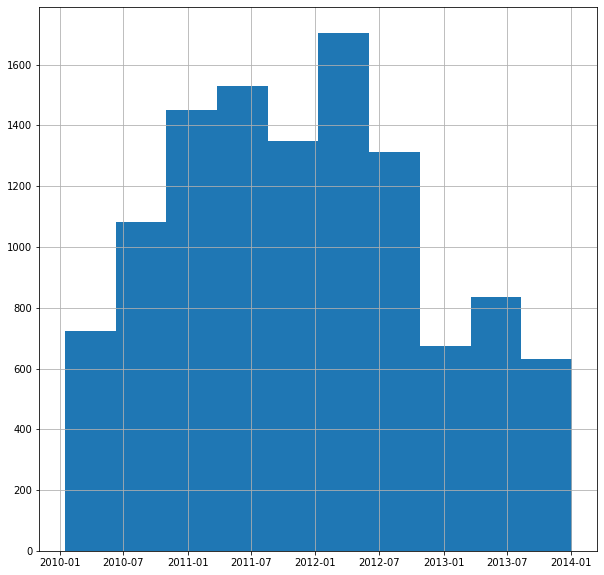

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,10))
GA_model_df['time:timestamp'].hist()

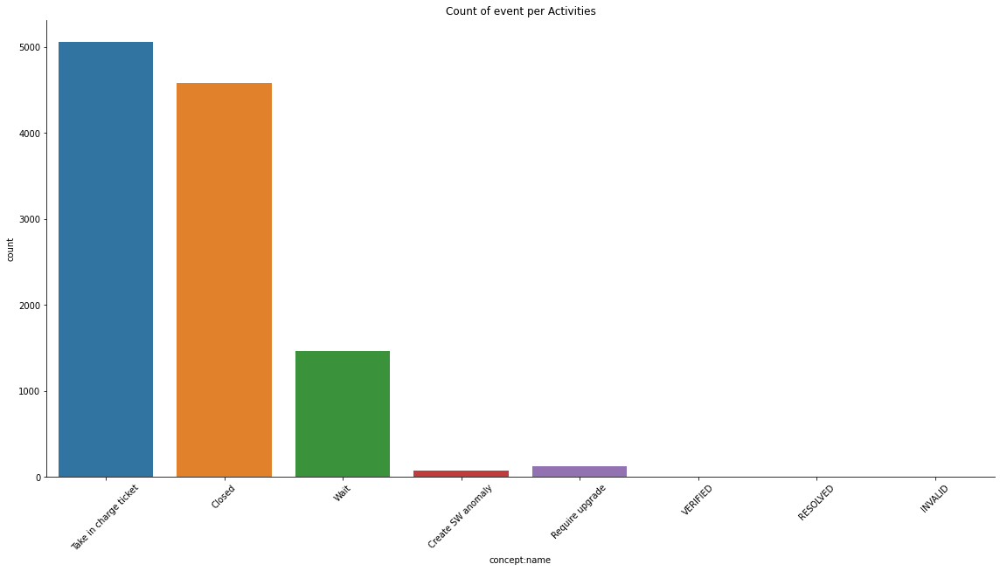

In [ ]:
fig = sns.catplot(x='concept:name', kind='count', data=GA_model_df, height=8, aspect=2)
plt.xticks(rotation=45)
plt.title('Count of event per Activities')
plt.show(fig)

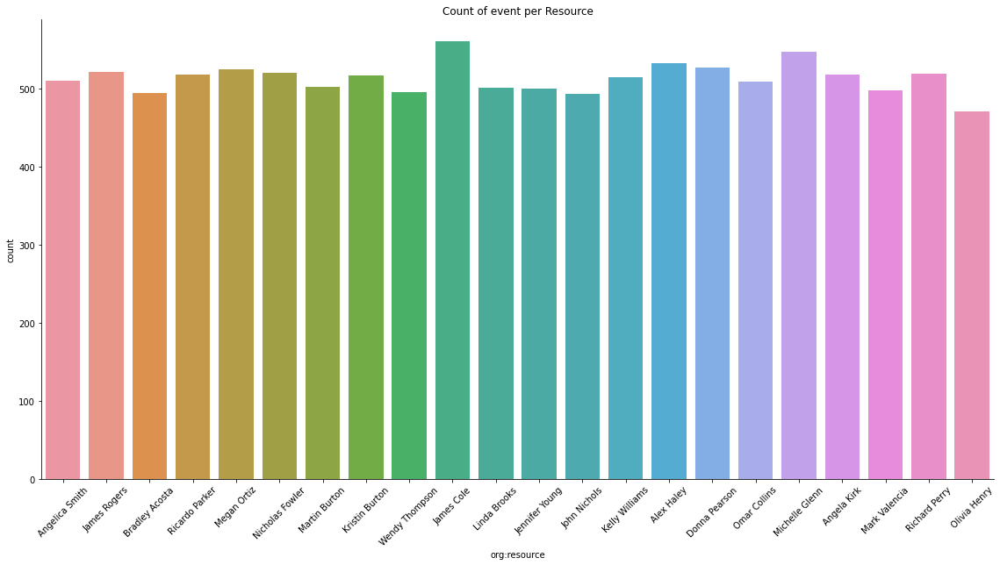

In [ ]:
fig = sns.catplot(x='org:resource', kind='count', data=GA_model_df, height=8, aspect=2)
plt.xticks(rotation=45)
plt.title('Count of event per Resource')
plt.show(fig)

In [ ]:
#ax=sns.countplot(x=GA_model_df['org:resource'],data=GA_model_df)

#ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")  #it will rotate text on x axis

#plt.tight_layout()
#plt.show()

In [ ]:
activities = pm4py.get_event_attribute_values(GA_model_df, "concept:name")
resources = pm4py.get_event_attribute_values(GA_model_df, "org:resource")

In [ ]:
activities

{'Take in charge ticket': 5060,
 'Closed': 4574,
 'Wait': 1463,
 'Require upgrade': 119,
 'Create SW anomaly': 67,
 'VERIFIED': 3,
 'RESOLVED': 2,
 'INVALID': 2}

In [ ]:
resources

{'James Cole': 560,
 'Michelle Glenn': 547,
 'Alex Haley': 532,
 'Donna Pearson': 527,
 'Megan Ortiz': 524,
 'James Rogers': 521,
 'Nicholas Fowler': 520,
 'Richard Perry': 519,
 'Ricardo Parker': 518,
 'Angela Kirk': 518,
 'Kristin Burton': 517,
 'Kelly Williams': 514,
 'Angelica Smith': 510,
 'Omar Collins': 509,
 'Martin Burton': 502,
 'Linda Brooks': 501,
 'Jennifer Young': 500,
 'Mark Valencia': 498,
 'Wendy Thompson': 495,
 'Bradley Acosta': 494,
 'John Nichols': 493,
 'Olivia Henry': 471}

### VISPM https://github.com/AdamBanham/vispm

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[StaticDottedChartPresentor] Cleaning up plot... 
[StaticDottedChartPresentor] Plot is ready to show... 


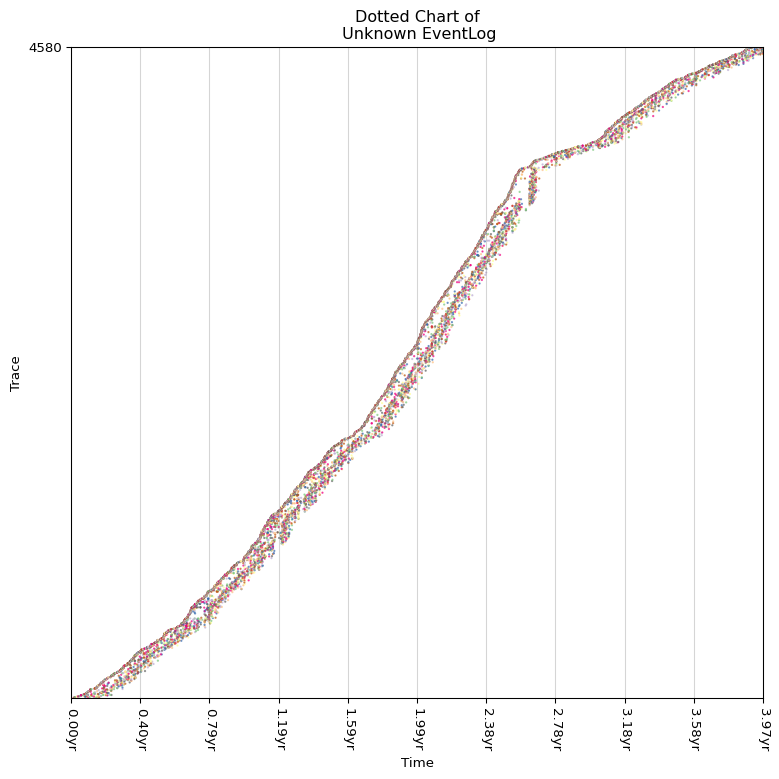

In [ ]:
# Static Presentors
from vispm import StaticDottedChartPresentor
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM,EARTH,COOL_WINTER,CATEGORICAL
from matplotlib import pyplot as plt

presentor = StaticDottedChartPresentor(GA_model)
presentor.plot()
plt.show()

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Added extension : DottedColourHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedColourHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedColourHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedColourHistogramExtension 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[DottedColourHistogramExtension] ploting histogram... 
[DottedColourHistogramExtension] ploting histogram... 
[DottedColourHistogramExtension] ploting histogram... 
[DottedColourHistogramExtension] ploting histogram... 
[StaticDottedChartPresentor] Cleaning up plot... 
[StaticDottedChartPresentor] Plot is ready to show... 


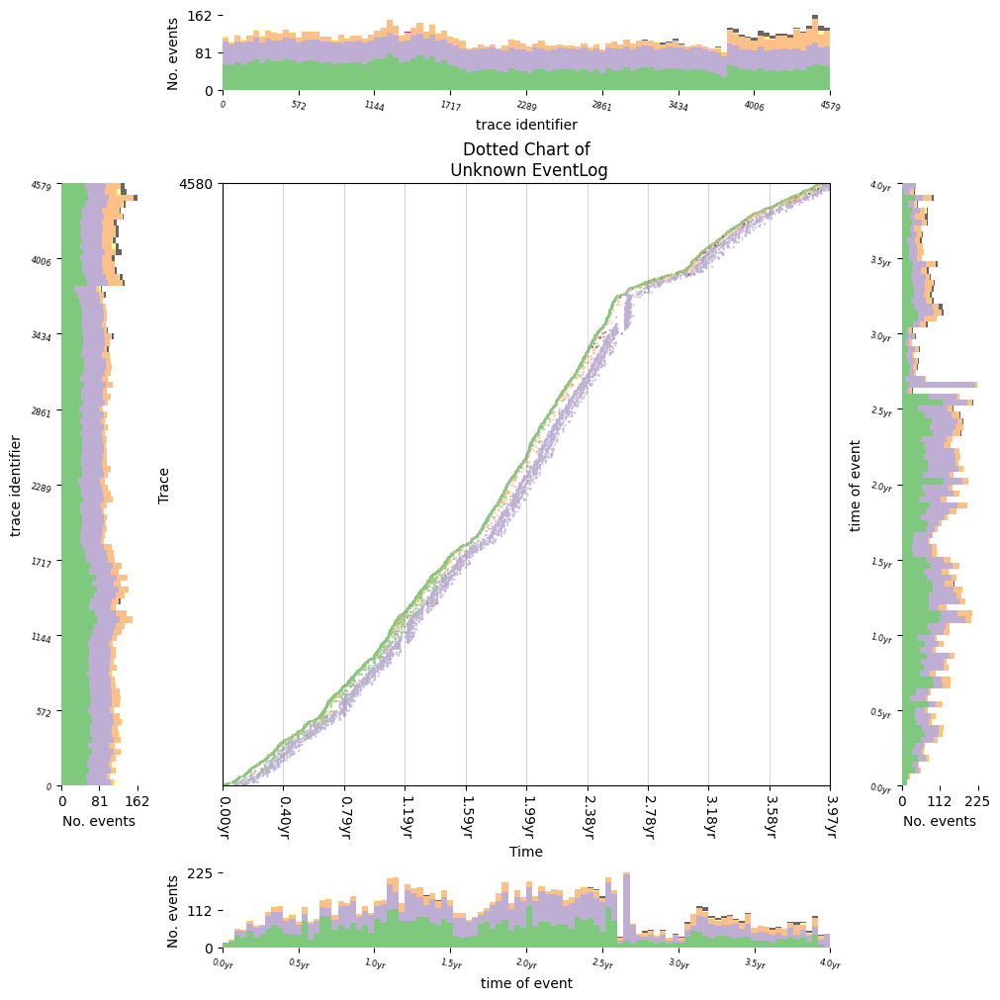

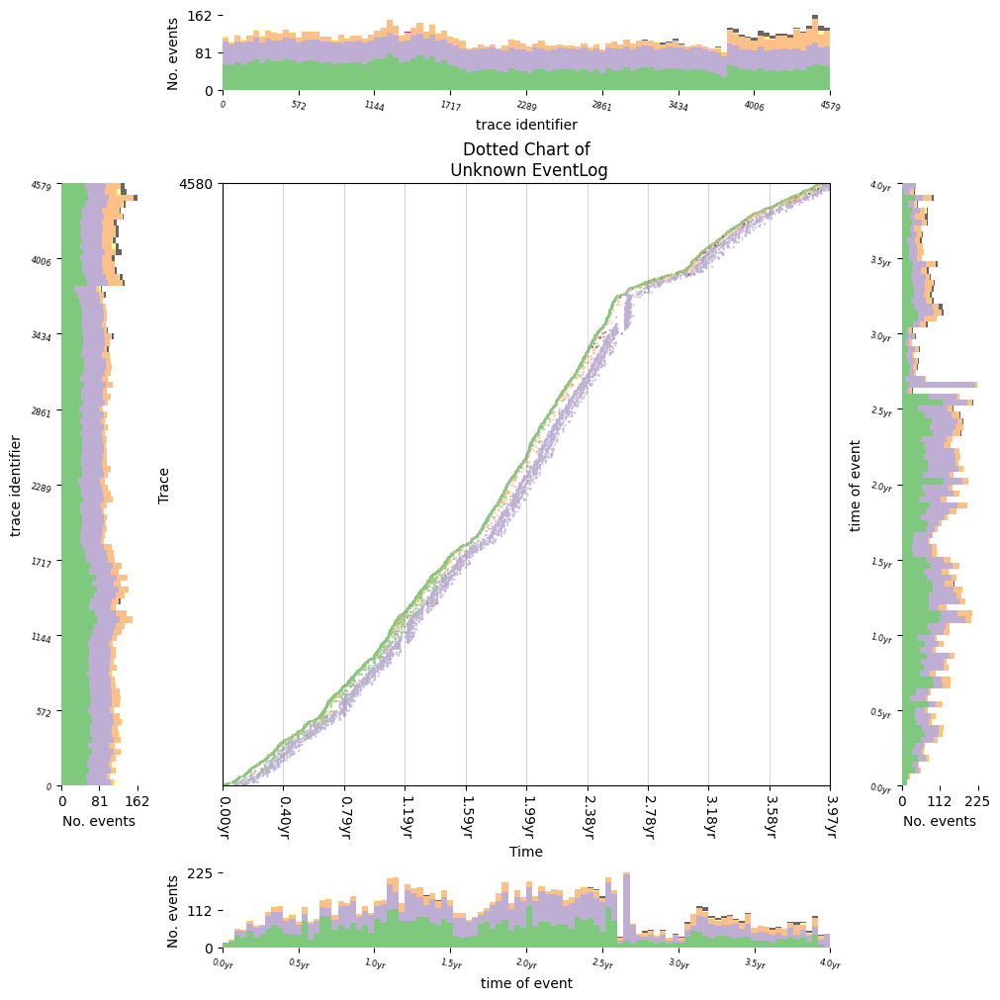

In [ ]:
# DottedColourHistogramExtension
#This extension plots a histogram based on the events within a dotted chart. Events will be broken down by colour for each bin.
from vispm import StaticDottedChartPresentor, DottedColourHistogramExtension
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM,EARTH,COOL_WINTER,CATEGORICAL


presentor = StaticDottedChartPresentor(GA_model,dpi=100,
    event_colour_scheme=StaticDottedChartPresentor.EventColourScheme.EventLabel,
    colormap=CATEGORICAL
)
ext = DottedColourHistogramExtension(direction=DottedColourHistogramExtension.Direction.NORTH)
presentor.add_extension(ext)
ext = DottedColourHistogramExtension(direction=DottedColourHistogramExtension.Direction.SOUTH,
         bin_axes=DottedColourHistogramExtension.PlotAxes.X)
presentor.add_extension(ext)
ext = DottedColourHistogramExtension(direction=DottedColourHistogramExtension.Direction.WEST)
presentor.add_extension(ext)
ext = DottedColourHistogramExtension(direction=DottedColourHistogramExtension.Direction.EAST,
         bin_axes=DottedColourHistogramExtension.PlotAxes.X)
presentor.add_extension(ext)
presentor.plot()

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[DottedEventHistogramExtension] ploting histogram... 
[DottedEventHistogramExtension] Event labels are imputed as :: {'Take in charge ticket': 'A', 'Wait': 'B', 'Require upgrade': 'C', 'Closed': 'D', 'Create SW anomaly': 'E', 'RESOLVED': 'F', 'INVALID': 'G', 'VERIFIED': 'H'} 
[DottedEventHistogramExtension] ploting histogram... 
[DottedEventHistogramExtension] Event labels are imputed as :: {'Take

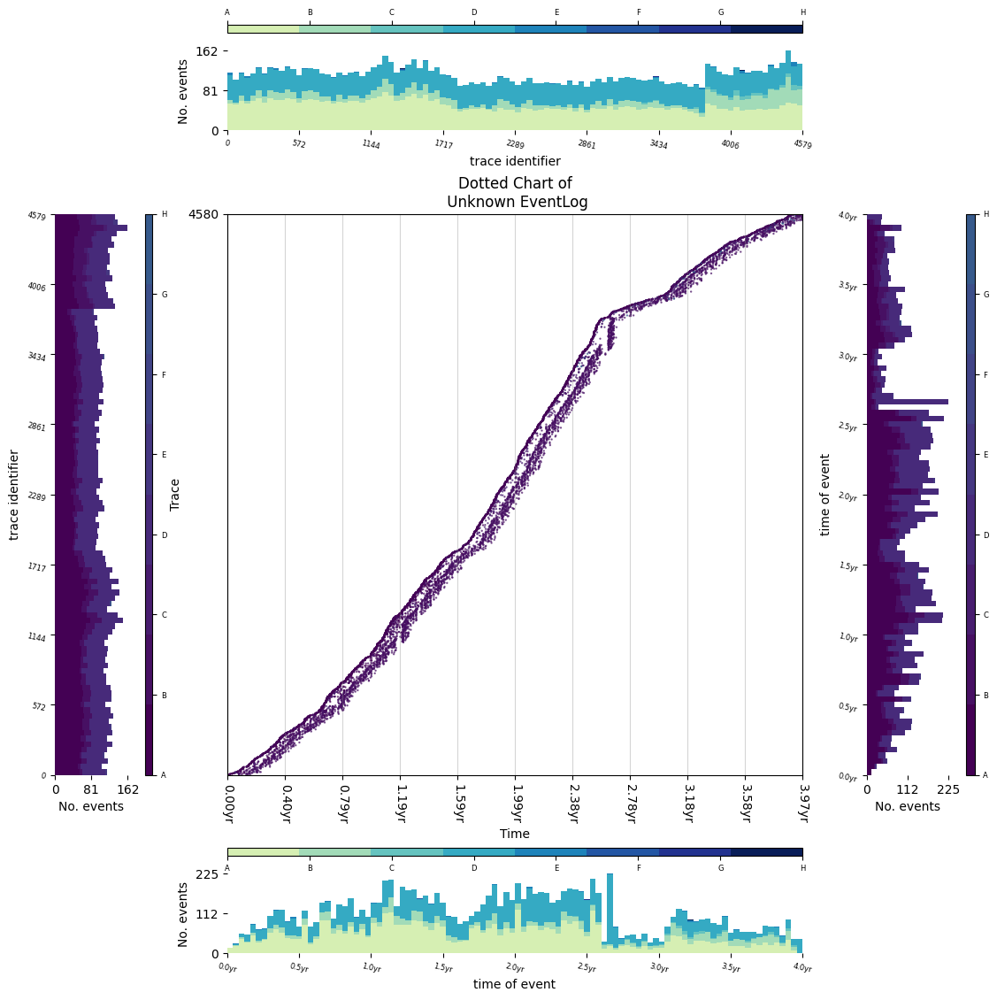

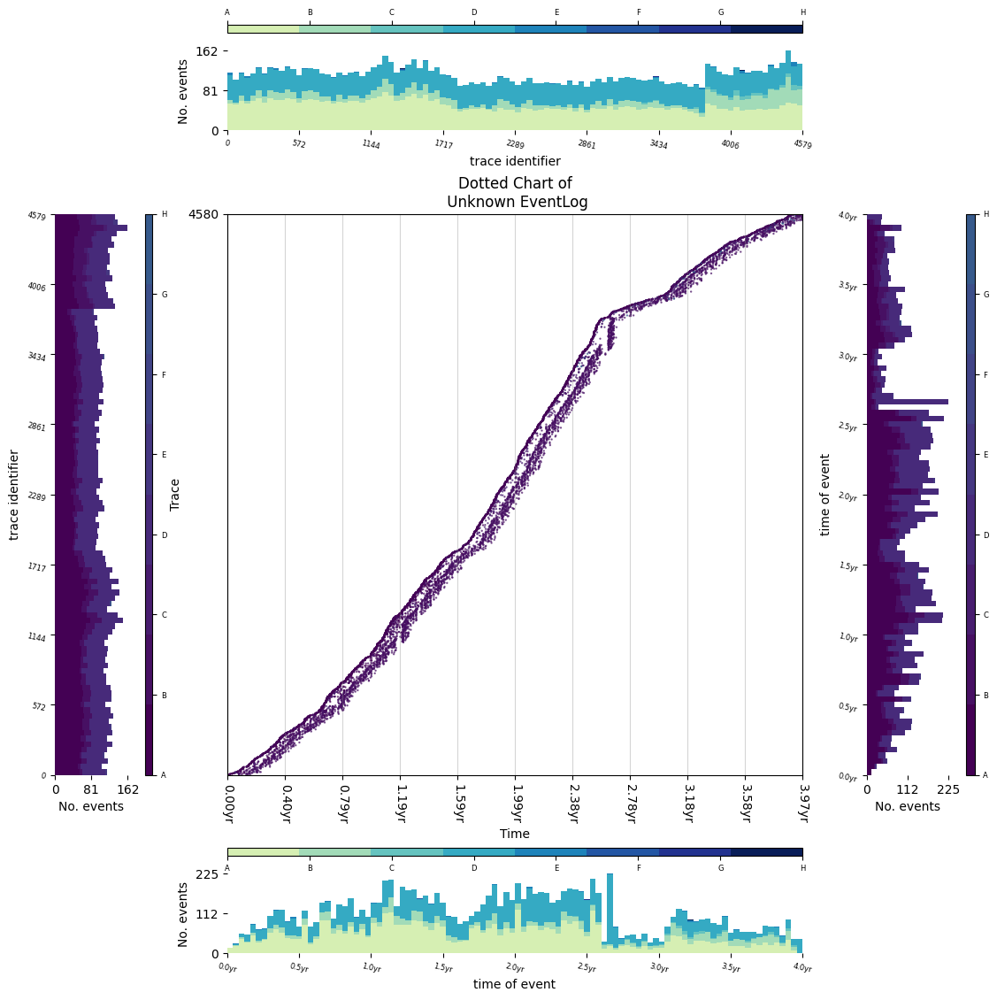

In [ ]:
# 1. setup up colour schemes to use
from vispm import StaticDottedChartPresentor, DottedColourHistogramExtension, DottedEventHistogramExtension
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM
from vispm.helpers.colours.colourmaps import EARTH,COOL_WINTER
from vispm import StaticDottedChartPresentor,DottedColourHistogramExtension

import numpy as np
from matplotlib.colors import ListedColormap
from matplotlib.cm import get_cmap

colourmaps = [COOL_WINTER,EARTH,HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM]
seq_colourmap = np.vstack(
    (
    colourmaps[0](np.linspace(0.20,1,8)),
    colourmaps[1](np.linspace(0.20,1,8)),
    colourmaps[2](np.linspace(0.20,1,8)),
    colourmaps[3](np.linspace(0.20,1,8))
    
    )
)
seq_colourmap = ListedColormap(seq_colourmap, name='VARIANCE')
cmap = get_cmap(HIGH_CONTRAST_COOL, 26)


# 2. create a presentor and add extensions
presentor = StaticDottedChartPresentor(GA_model,dpi=100,
    event_colour_scheme=StaticDottedChartPresentor.EventColourScheme.EventLabel,
    colormap=cmap
)

ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.SOUTH,
    bin_axes=DottedEventHistogramExtension.PlotAxes.X,
    colourmap=seq_colourmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.NORTH,
    bin_axes=DottedEventHistogramExtension.PlotAxes.Y,
    colourmap=seq_colourmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.WEST,
    bin_axes=DottedEventHistogramExtension.PlotAxes.Y,
    colourmap=cmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.EAST,
    bin_axes=DottedEventHistogramExtension.PlotAxes.X,
    colourmap=cmap
)
presentor.add_extension(ext)

presentor.plot()

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[DottedEventHistogramExtension] ploting histogram... 
[DottedEventHistogramExtension] Event labels are imputed as :: {'Take in charge ticket': 'A', 'Wait': 'B', 'Require upgrade': 'C', 'Closed': 'D', 'Create SW anomaly': 'E', 'RESOLVED': 'F', 'INVALID': 'G', 'VERIFIED': 'H'} 
[DottedEventHistogramExtension] ploting histogram... 
[DottedEventHistogramExtension] Event labels are imputed as :: {'Take

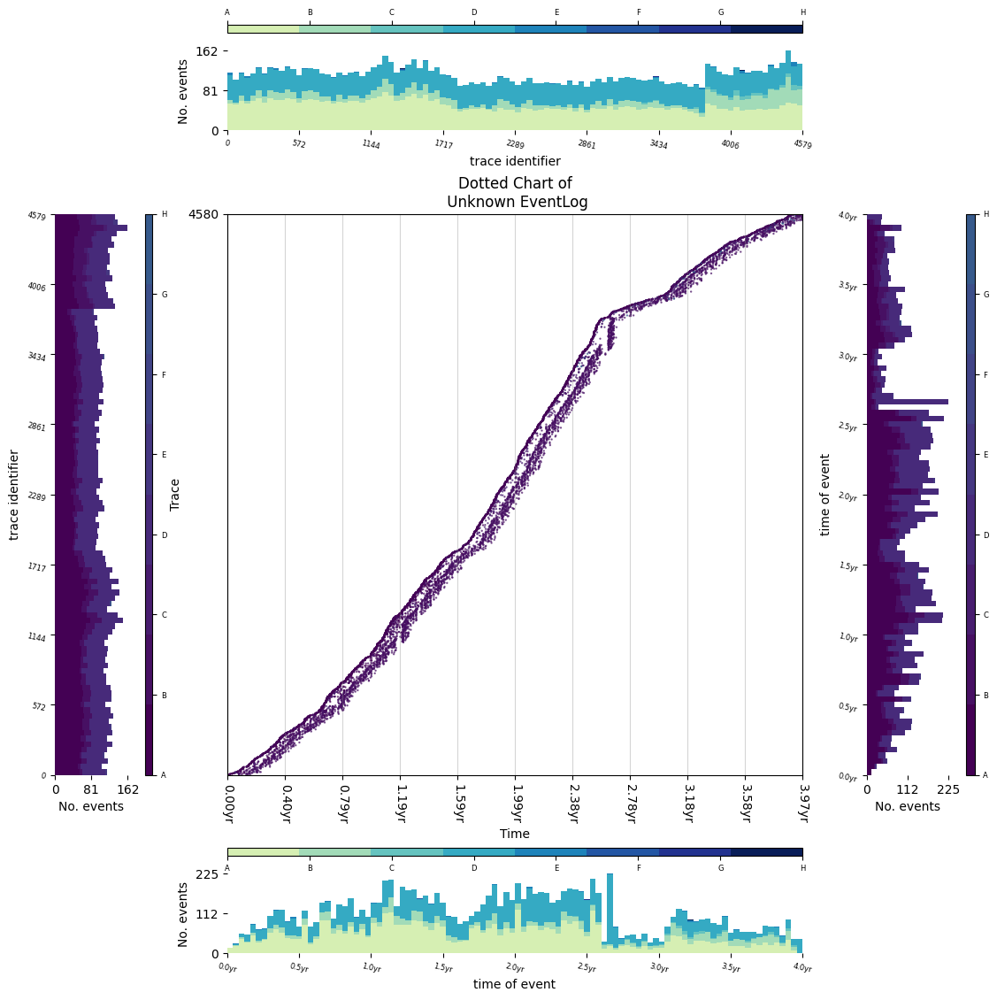

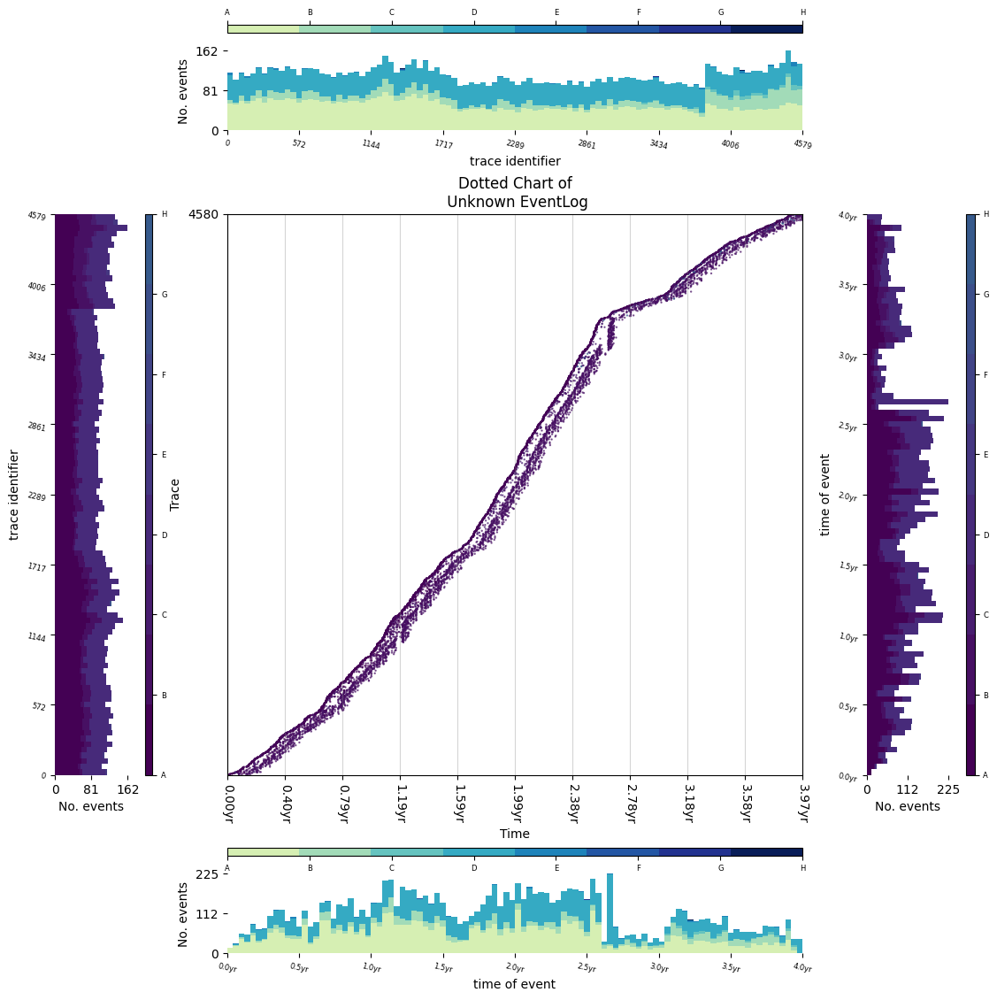

In [ ]:
# 1. setup up colour schemes to use
from vispm import StaticDottedChartPresentor, DottedColourHistogramExtension, DottedEventHistogramExtension
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM,EARTH,COOL_WINTER,CATEGORICAL
from vispm import StaticDottedChartPresentor,DottedColourHistogramExtension

import numpy as np
from matplotlib.colors import ListedColormap
from matplotlib.cm import get_cmap

colourmaps = [COOL_WINTER,EARTH,HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM, CATEGORICAL]
seq_colourmap = np.vstack(
    (
    colourmaps[0](np.linspace(0.20,1,8)),
    colourmaps[1](np.linspace(0.20,1,8)),
    colourmaps[2](np.linspace(0.20,1,8)),
    colourmaps[3](np.linspace(0.20,1,8)),
    colourmaps[4](np.linspace(0.20,1,8))
    
    )
)
seq_colourmap = ListedColormap(seq_colourmap, name='VARIANCE')
cmap = get_cmap(HIGH_CONTRAST_COOL, 26)


# 2. create a presentor and add extensions
presentor = StaticDottedChartPresentor(GA_model,dpi=100,
    event_colour_scheme=StaticDottedChartPresentor.EventColourScheme.EventLabel,
    colormap=cmap
)

ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.SOUTH,
    bin_axes=DottedEventHistogramExtension.PlotAxes.X,
    colourmap=seq_colourmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.NORTH,
    bin_axes=DottedEventHistogramExtension.PlotAxes.Y,
    colourmap=seq_colourmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.WEST,
    bin_axes=DottedEventHistogramExtension.PlotAxes.Y,
    colourmap=cmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.EAST,
    bin_axes=DottedEventHistogramExtension.PlotAxes.X,
    colourmap=cmap
)
presentor.add_extension(ext)

presentor.plot()

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Added extension : DescriptionHistogramExtension 
[StaticDottedChartPresentor] Added extension : DescriptionHistogramExtension 
[StaticDottedChartPresentor] Added extension : DescriptionHistogramExtension 
[StaticDottedChartPresentor] Added extension : DescriptionHistogramExtension 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[DescriptionHistogramExtension] plotting histogram 
[DescriptionHistogramExtension] Event labels are imputed as :: {'Take in charge ticket': 'A', 'Wait': 'B', 'Require upgrade': 'C', 'Closed': 'D', 'Create SW anomaly': 'E', 'RESOLVED': 'F', 'INVALID': 'G', 'VERIFIED': 'H'} 
[DescriptionHistogramExtension] plotting histogram 
[DescriptionHistogramExtension] plotting histogram 
[DescriptionHistogram

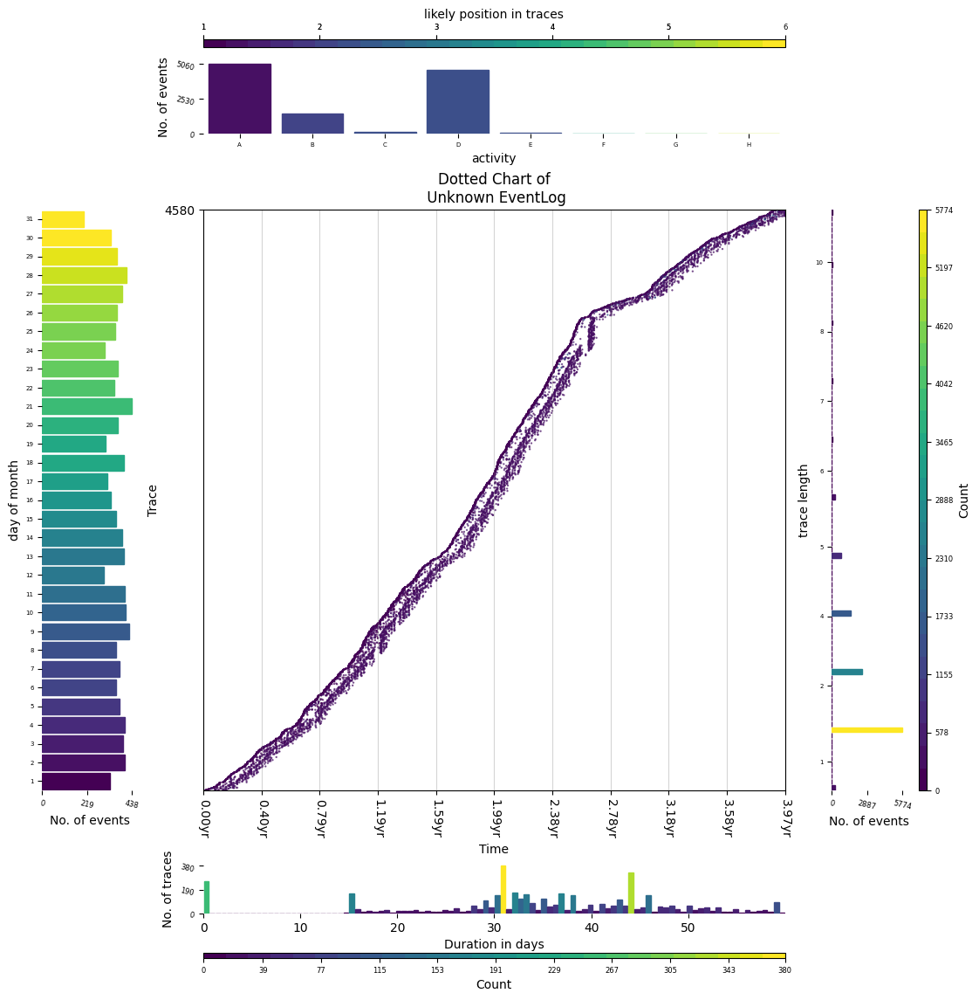

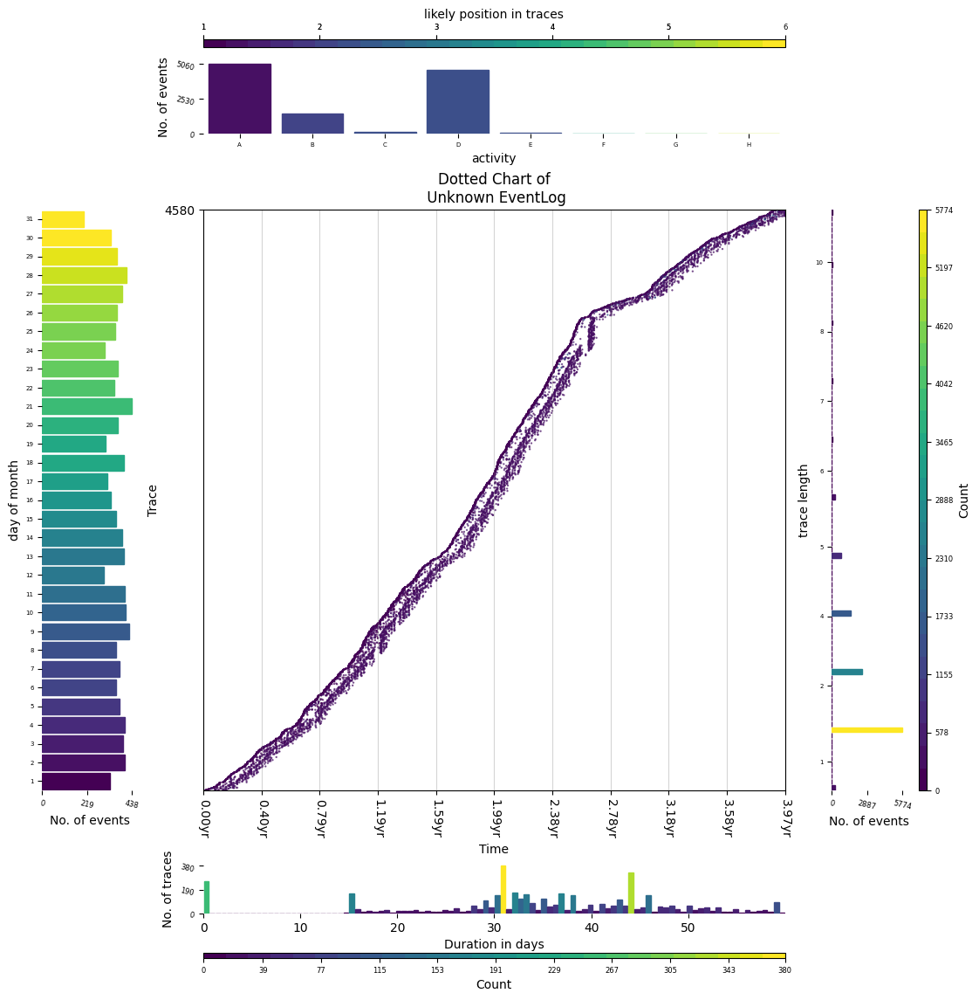

In [ ]:
#DescriptionHistogramExtension
#This extension describes an aspect of the event log.
# For example, a breakdown of trace duration, or trace length (by the number of activities), or event label, or when events occur (weekday or monthday).

#The following example shows how to use this extension to understand the properties of event log, alongside a dotted chart.


from vispm import DescriptionHistogramExtension
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM,EARTH,COOL_WINTER,CATEGORICAL
from vispm import StaticDottedChartPresentor,DottedColourHistogramExtension


cmap = get_cmap(HIGH_CONTRAST_COOL, 26)
presentor = StaticDottedChartPresentor(GA_model,dpi=100,
    event_colour_scheme=StaticDottedChartPresentor.EventColourScheme.EventLabel,
    colormap=cmap
)

ext = DescriptionHistogramExtension(
)
presentor.add_extension(ext)

ext = DescriptionHistogramExtension(
    direction=DescriptionHistogramExtension.Direction.EAST,
    describe=DescriptionHistogramExtension.Describe.TraceLength,
    density=DescriptionHistogramExtension.Density.Event
)
presentor.add_extension(ext)

ext = DescriptionHistogramExtension(
    direction=DescriptionHistogramExtension.Direction.SOUTH,
    describe=DescriptionHistogramExtension.Describe.TraceDuration,
    density=DescriptionHistogramExtension.Density.Trace
)
presentor.add_extension(ext)

ext = DescriptionHistogramExtension(
    direction=DescriptionHistogramExtension.Direction.WEST,
    describe=DescriptionHistogramExtension.Describe.Monthday,
    density=DescriptionHistogramExtension.Density.Event
)
presentor.add_extension(ext)

presentor.plot()

# BPI 2012

In [ ]:
BPI2012 = namedtuple( 'BPI2012', ['name','days_to_finish', 'percentage'])

max_days = 296

things = [
          
          BPI2012('W_Afhandelen leads', 4 , 8),
          BPI2012('W_Completeren aanvraag',32 , 33),
          BPI2012('W_Nabellen offertes',91 , 31),
          BPI2012('W_Valideren aanvraag',85 , 12),
          BPI2012('W_Beoordelen fraude',34 , 1),
          BPI2012('W_Nabellen incomplete dossiers',84 , 16),
        ]

In [ ]:
def generate_genome(length: int) -> Genome:
    return choices([0, 1], k=length)

In [ ]:
def generate_population(size: int, genome_length: int) -> Population:
    return [generate_genome(genome_length) for _ in range(size)]  

In [ ]:
def fitness(genome: Genome, things: List[BPI2012], percentage_limit: int) -> int:
  if len(genome) != len(things):
    raise ValueError( "genome and BPI2012 must be the same length")
  
  percentage = 0
  days_to_finish = 0

  for i, BPI2012 in enumerate(things):
    if genome[i] == 1:
      percentage += BPI2012.percentage
      days_to_finish += BPI2012.days_to_finish
      
    if percentage > percentage_limit:
      return 0

  return days_to_finish 


In [ ]:
def selection_pair(population: Population, fitness_func: FitnessFunc) -> Population:
    return choices(
        population = population,
        percentages = [fitness_func(gene) for gene in population],
        k=2
    )


In [ ]:
def single_point_crossover(a: Genome, b: Genome) -> Tuple[Genome, Genome]:
  if len(a) != len(b):
    raise ValueError("Genome a and b must be of the same length")
  
  length = len(a)
  if length < 2:
    return a,b

  
  p = randint(1, length -1)
  return a[0:p] + b[p:], b[0:p], a[p:]

In [ ]:
def mutation(genome: Genome, num: int = 1, probability: float = 0.5) -> Genome:
    for _ in range(num):
        index = randrange(len(genome))
        genome[index] = genome[index] if random() > probability else abs(genome[index] - 1)
    return genome

In [ ]:
def run_evolution(
      populate_func: PopulateFunc,
      fitness_func: FitnessFunc,
      fitness_limit: int,
      selection_func: SelectionFunc = selection_pair,
      crossover_func: CrossoverFunc = single_point_crossover,
      mutation_func: MutationFunc = mutation,
      generation_limit: int = 100) -> Tuple[Population, int]:

    population = populate_func()

    for i in range(generation_limit):
      population = sorted(population, key=lambda genome: fitness_func(genome), reverse=True)

      if fitness_func(population[0]) >=fitness_limit:
        break
      
      next_generation = population[0:2]

      for j in range(int(len(population) / 2) - 1):
        parents = selection_func(population, fitness_func)
        offspring_a, offspring_b = crossover_func(parents[0], parents[1])
        offspring_a = mutation_func(offspring_a)
        offspring_b = mutation_func(offspring_b)
        next_generation += [offspring_a, offspring_b]

      population = next_generation

    population = sorted(population, key=lambda genome: fitness_func(genome),reverse=True)
    return population, i

In [ ]:
import time
from functools import partial

In [ ]:
start = time.time()

population, generations = run_evolution(
    populate_func= partial(generate_population, size=6, genome_length=len(things)),                         
    fitness_func=partial(fitness, things=things, percentage_limit=100),
    fitness_limit = 100,
    generation_limit=10000) 

end = time.time()

In [ ]:
def genome_to_things(genome: Genome, things: List[BPI2012]) -> List[BPI2012]:
  result = []
  for i, BPI2012 in enumerate(things):
    if genome[i] == 1:
      result += [BPI2012.name]
  return result

In [ ]:
print(f"number of generations: {generations}")
print(f"time: {end - start}s")
print(f"best solution: {genome_to_things(population[0], things)}")

number of generations: 0
time: 0.0003209114074707031s
best solution: ['W_Afhandelen leads', 'W_Nabellen offertes', 'W_Beoordelen fraude', 'W_Nabellen incomplete dossiers']


## Simple Genetic Algorithm Model BPI 2012

In [16]:
review_example_log = pm4py.read_xes('/content/drive/MyDrive/Abou Keita - Capstone 606/Datasets/cleaned_bpi2012_log.xes')
reviewlog = pm4py.convert_to_event_log(review_example_log)

parsing log, completed traces ::   0%|          | 0/9658 [00:00<?, ?it/s]

/usr/local/lib/python3.8/dist-packages/pm4py/utils.py:486: UserWarning: the EventLog class has been deprecated and will be removed in a future release.
  warnings.warn("the EventLog class has been deprecated and will be removed in a future release.")


In [17]:
#drop the columns not part of the fitness
rows= ['W_Afhandelen leads', 'W_Nabellen offertes', 'W_Beoordelen fraude', 'W_Nabellen incomplete dossiers']
GA_model_df =review_example_log[review_example_log['concept:name'].isin(rows)]


In [18]:
GA_model = pm4py.convert_to_event_log(GA_model_df)

/usr/local/lib/python3.8/dist-packages/pm4py/utils.py:486: UserWarning: the EventLog class has been deprecated and will be removed in a future release.
  warnings.warn("the EventLog class has been deprecated and will be removed in a future release.")


BPMN Model

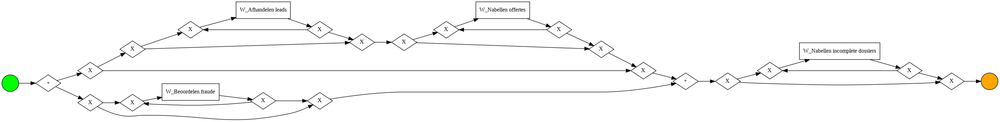

In [ ]:
cp_bpmn_model = pm4py.discover_bpmn_inductive(GA_model)
pm4py.view_bpmn(cp_bpmn_model)

dfg model

<ipython-input-95-76b93a604bd5>:1: DeprecatedWarning: discover_dfg is deprecated as of 2.3.0 and will be removed in 2.4.0. this method will be replaced by the discover_dfg_typed function(). Please adapt your code to use pm4py.discover_dfg_typed()
  cpdfg, cp_start_activities, cp_end_activities = pm4py.discover_dfg(GA_model)


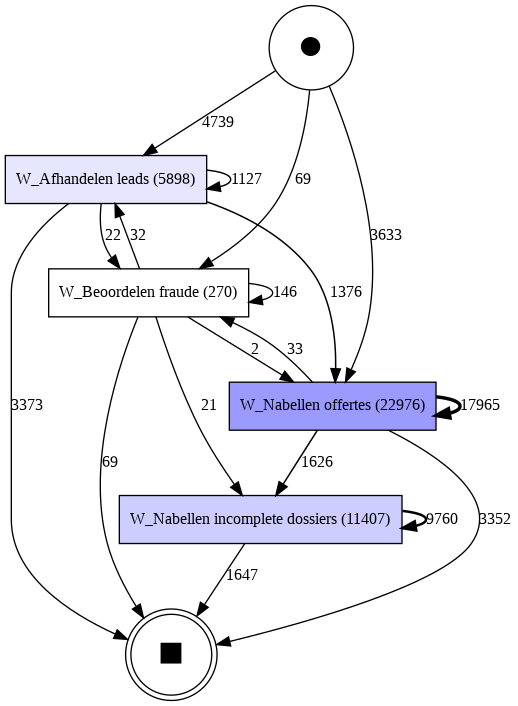

In [ ]:
cpdfg, cp_start_activities, cp_end_activities = pm4py.discover_dfg(GA_model)
pm4py.view_dfg(cpdfg, cp_start_activities, cp_end_activities)

heuritic miner model

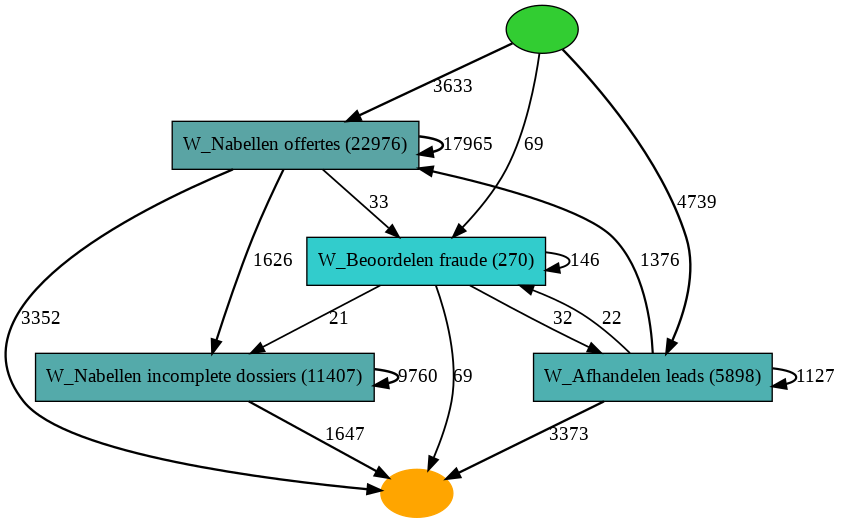

In [ ]:
#show the heuritic miner model
cp_map = pm4py.discover_heuristics_net(GA_model)
pm4py.view_heuristics_net(cp_map)

In [ ]:
# number of event in the cpm event log
num_event = len(GA_model_df)
num_cases = len(GA_model_df['case:concept:name'].unique())
print("number of event: {} \n Number of unique cases: {}".format(num_event, num_cases))
ppl_invovled = GA_model_df['org:resource'].unique()
num_ppl_invovled = len(GA_model_df['org:resource'].unique())
print("The resources or people invovled are: {} \n The number of resources are: {}".format(ppl_invovled, num_ppl_invovled))

number of event: 40551 
 Number of unique cases: 8441
The resources or people invovled are: ['Robert Peters' 'Christina Barnes' 'David Adams' 'Brandon Powell'
 'Aaron Ray' 'Scott Little' 'Brianna Martinez' 'Laura Morris'
 'Wesley Mills' 'Brittany Valencia' 'Lisa Henson' 'Anna Schroeder'
 'Rhonda Brady' 'Emily Rice' 'Justin Thompson' 'Derrick Watts'
 'Rebecca Guerrero' 'Donald Wilson' 'Emily Rojas' 'Austin Jones'
 'Joshua Phelps' 'Sarah Hogan' 'Nathan Thomas' 'Vanessa Shepherd'
 'William Arroyo' 'Mary Thompson' 'Steven Jones' 'Patricia Lloyd'
 'Matthew Walker' 'Kayla Woods' 'Luis Jackson' 'Michelle Brennan'
 'Martha Costa' 'Shawn Barnes' 'Jennifer Thomas MD' 'Heather Patterson'
 'Pam Martinez' 'Miguel Reeves' 'Jesse Moore' 'Travis Edwards'
 'Donald White' 'Ashley Daniel' 'Brianna Bell' 'Sherry Klein'
 'Nancy Clayton' 'Jacob Wilson' 'Michael Anderson MD' 'Jennifer Wilson'
 'Kathy Ingram' 'Jane Turner' 'David Doyle' 'Kevin Schultz' 'Patrick Cole'
 'Paul Alvarado' 'Ruth Davies' 'Jennifer C

### Model Evaluation - Conformance checking

Conformance checking techniques compare a process model with an event log of the same process. The goal is to check if the event log conforms to the model, and, vice versa. Only works with Petri Net models
- https://pm4py.fit.fraunhofer.de/static/assets/api/2.3.0/apihtml#conformance-checking-pm4py-conformance

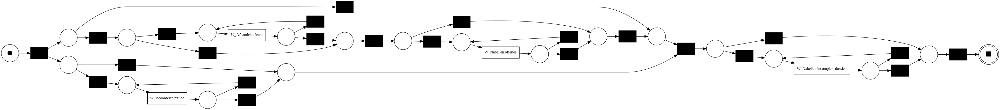

In [ ]:
# conversion to petri net
p_net, pnet_im, pnet_fm = pm4py.convert_to_petri_net(cp_bpmn_model)
pm4py.view_petri_net(p_net, pnet_im, pnet_fm)

Soundness

In [ ]:
#Checking Behavioral Model Properties
pm4py.check_soundness(p_net, pnet_im, pnet_fm)

#from pm4py.algo.analysis.woflan import algorithm as woflan
#is_sound = woflan.apply(p_net, pnet_im, pnet_fm, parameters={woflan.Parameters.RETURN_ASAP_WHEN_NOT_SOUND: False,
#                                                     woflan.Parameters.PRINT_DIAGNOSTICS: True,
#                                                     woflan.Parameters.RETURN_DIAGNOSTICS: False})

Input is ok.
Petri Net is a workflow net.
Every place is covered by s-components.
There are no dead tasks.
All tasks are live.


True

Replay Fitness

The fitness  of an event log  w.r.t. a model  is the fraction of log behavior that is described by the model.

 1 = all behavior described by the event log is also described by the model

 0 = none of the behavior described by the event log is also described by the mode

 - For token-based replay, the percentage of traces that are completely fit is returned, along with a fitness value that is calculated.
 - For alignments, the percentage of traces that are completely fit is returned, along with a fitness value that is calculated as the average of the fitness values of the single traces.

In [ ]:
#token_based_replay compared to orginal log
pm4py.fitness_token_based_replay(reviewlog, p_net, pnet_im, pnet_fm)

replaying log with TBR, completed variants ::   0%|          | 0/2263 [00:00<?, ?it/s]

{'perc_fit_traces': 100.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 1.0,
 'percentage_of_fitting_traces': 100.0}

In [ ]:
#alignments conmpared to original log
alignments_fitness = pm4py.fitness_alignments(reviewlog, p_net, pnet_im, pnet_fm)
alignments_fitness

aligning log, completed variants ::   0%|          | 0/2263 [00:00<?, ?it/s]

{'percFitTraces': 23.721267343135224,
 'averageFitness': 0.5884421914465344,
 'percentage_of_fitting_traces': 23.721267343135224,
 'average_trace_fitness': 0.5884421914465344,
 'log_fitness': 0.5598489924054908}

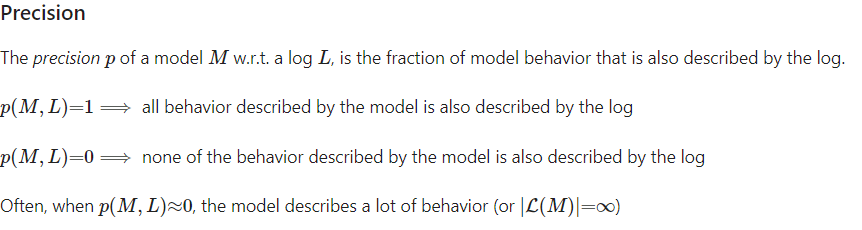

In [ ]:
#token_based_replay compared to orginal log
pm4py.precision_token_based_replay(reviewlog, p_net, pnet_im, pnet_fm)

replaying log with TBR, completed variants ::   0%|          | 0/9372 [00:00<?, ?it/s]

0.43287682702824337

In [ ]:
#alignments conmpared to original log
pm4py.precision_alignments(reviewlog, p_net, pnet_im, pnet_fm)

computing precision with alignments, completed variants ::   0%|          | 0/9372 [00:00<?, ?it/s]

0.5293194237456533

Diagnostics

In [ ]:
alignments = pm4py.conformance_diagnostics_alignments(reviewlog, p_net, pnet_im, pnet_fm)
alignments[0]

aligning log, completed variants ::   0%|          | 0/2263 [00:00<?, ?it/s]

{'alignment': [('W_Completeren aanvraag', '>>'),
  ('>>', None),
  ('>>', None),
  ('>>', None),
  ('>>', None),
  ('>>', None),
  ('W_Nabellen offertes', 'W_Nabellen offertes'),
  ('>>', None),
  ('>>', None),
  ('W_Nabellen offertes', 'W_Nabellen offertes'),
  ('>>', None),
  ('W_Nabellen offertes', 'W_Nabellen offertes'),
  ('W_Valideren aanvraag', '>>'),
  ('>>', None),
  ('>>', None),
  ('>>', None),
  ('>>', None),
  ('>>', None)],
 'cost': 20013,
 'visited_states': 46,
 'queued_states': 107,
 'traversed_arcs': 124,
 'lp_solved': 40,
 'fitness': 0.6,
 'bwc': 50006}

Generalization: analyse how the log and the process model match

In [ ]:
from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
generalization_evaluator.apply(reviewlog, p_net, pnet_im, pnet_fm)

replaying log with TBR, completed variants ::   0%|          | 0/2263 [00:00<?, ?it/s]

0.9755144820725014

Simplicity: the fourth dimension to analyse a process model. In this case, we define simplicity taking into account only the Petri net model. 

In [ ]:
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simplicity_evaluator.apply(p_net)

0.7230769230769232

### Statistics

In [19]:
#case description
simple_ga_descritpion = duration_statistics_module.duration_statistics.cases_description(GA_model)
simple_ga_descritpion

{'173688': {'startTime': 1317464228.924,
  'endTime': 1318239185.791,
  'caseDuration': 774956.8669998646},
 '173691': {'startTime': 1317472585.794,
  'endTime': 1318234485.514,
  'caseDuration': 761899.7200000286},
 '173694': {'startTime': 1317642261.261,
  'endTime': 1320221718.683,
  'caseDuration': 2579457.4220001698},
 '173706': {'startTime': 1317457009.843,
  'endTime': 1317457009.843,
  'caseDuration': 0.0},
 '173712': {'startTime': 1317456625.759,
  'endTime': 1317456625.759,
  'caseDuration': 0.0},
 '173715': {'startTime': 1318084697.372,
  'endTime': 1318244044.785,
  'caseDuration': 159347.4130001068},
 '173718': {'startTime': 1317458698.974,
  'endTime': 1319609558.415,
  'caseDuration': 2150859.4409999847},
 '173721': {'startTime': 1317460972.458,
  'endTime': 1318256909.918,
  'caseDuration': 795937.4600000381},
 '173724': {'startTime': 1317463947.6,
  'endTime': 1317464455.527,
  'caseDuration': 507.92700004577637},
 '173730': {'startTime': 1317476919.764,
  'endTime': 1

In [20]:
# convert the case description to excel format to create a visualization of it
case_description_convert = pd.DataFrame.from_dict(simple_ga_descritpion)
case_description_convert
# convert the case description to excel format to create a visualization of it
case_description_convert.to_excel("custom ga bpi2012 case description.xlsx") 

In [21]:
#Gets all the case durations out of the log
simple_ga_case_duration = duration_statistics_module.duration_statistics.all_case_duration(GA_model)
simple_ga_case_duration

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0

In [22]:
sc = pd.DataFrame (simple_ga_case_duration, columns = ['days cases'])
sc['days cases'] = sc['days cases'] /86400
sc = sc.drop_duplicates()
sc.to_excel('custom ga bpi2012 all_case_durationn.xlsx')

In [23]:
simple_ga_median_case_duration = duration_statistics_module.duration_statistics.median_case_duration(GA_model)
print("Median case duration in second: ",simple_ga_median_case_duration, "second")
print("Median case duration in days: ",simple_ga_median_case_duration / 86400, "days")

Median case duration in second:  348227.7190001011 second
Median case duration in days:  4.0304134143530215 days


### SNA

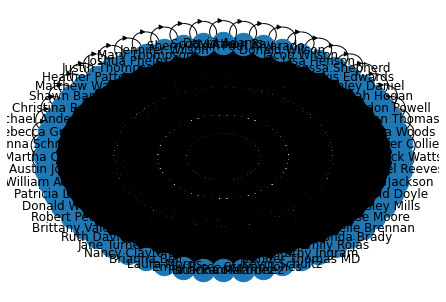

In [ ]:
handover_of_work = social_network_analysis_module.sna.handover_of_work(GA_model)

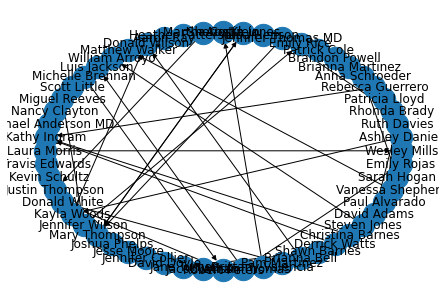

In [ ]:
subcontracting = social_network_analysis_module.sna.subcontracting(GA_model)

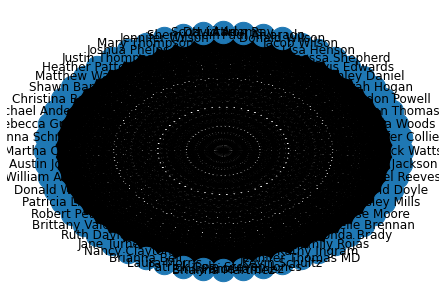

In [ ]:
working_together = social_network_analysis_module.sna.working_together(GA_model) 

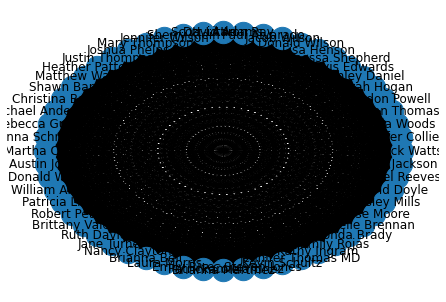

In [ ]:
similar_activities = social_network_analysis_module.sna.similar_activities(GA_model) 

In [ ]:
organizational_mining = social_network_analysis_module.sna.organizational_mining(GA_model) 


group_relative_focus
{'Robert Peters': {'W_Nabellen offertes': 0.01745299442896936, 'W_Afhandelen leads': 0.016615801966768397, 'W_Nabellen incomplete dossiers': 0.017182431840098187, 'W_Beoordelen fraude': 0.022222222222222223}, 'Christina Barnes': {'W_Nabellen offertes': 0.017104805013927575, 'W_Afhandelen leads': 0.018480840963038318, 'W_Nabellen incomplete dossiers': 0.01630577715437889, 'W_Beoordelen fraude': 0.014814814814814815}, 'David Adams': {'W_Nabellen offertes': 0.01749651810584958, 'W_Afhandelen leads': 0.020176330959647337, 'W_Nabellen incomplete dossiers': 0.018059086525817482, 'W_Beoordelen fraude': 0.025925925925925925}, 'Brandon Powell': {'W_Nabellen offertes': 0.017278899721448467, 'W_Afhandelen leads': 0.014750762970498474, 'W_Nabellen incomplete dossiers': 0.019023406680108705, 'W_Beoordelen fraude': 0.018518518518518517}, 'Aaron Ray': {'W_Nabellen offertes': 0.017844707520891366, 'W_Afhandelen leads': 0.015768056968463885, 'W_Nabellen incomplete dossiers': 0.019

In [ ]:
clustering = social_network_analysis_module.sna.clustering(GA_model) 

clustered similar activities metric: {'1': ['Brianna Martinez', 'Jennifer Thomas MD', 'Michelle Brennan', 'Ruth Davies', 'Patrick Cole', 'Jennifer Wilson', 'Travis Edwards', 'Emily Rice', 'Jesse Moore', 'Martha Costa', 'Kathy Ingram', 'Nathan Thomas', 'Brandon Powell', 'Jennifer Collier', 'Donald White', 'Kayla Woods', 'Shawn Barnes', 'Patricia Lloyd', 'Brittany Valencia', 'Aaron Ray', 'David Adams', 'Ashley Daniel', 'Austin Jones', 'Mary Thompson', 'Sarah Hogan', 'Kevin Schultz', 'Emily Rojas'], '0': ['Paul Alvarado', 'Donald Wilson', 'Rhonda Brady', 'Derrick Watts', 'Steven Jones', 'Justin Thompson', 'Joshua Phelps', 'Matthew Walker', 'Michael Anderson MD', 'Scott Little', 'Jane Turner', 'Robert Peters', 'Brianna Bell', 'Sherry Klein', 'David Doyle', 'Lisa Henson', 'Rebecca Guerrero', 'Pam Martinez', 'Miguel Reeves', 'Nancy Clayton', 'Luis Jackson', 'Wesley Mills', 'Jacob Wilson', 'Anna Schroeder', 'Heather Patterson', 'William Arroyo', 'Vanessa Shepherd', 'Laura Morris', 'Christina 

### EDA

<AxesSubplot: >

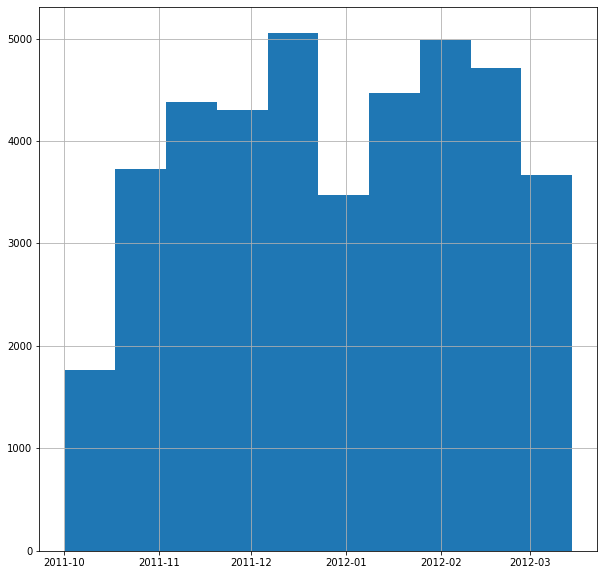

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,10))
GA_model_df['time:timestamp'].hist()

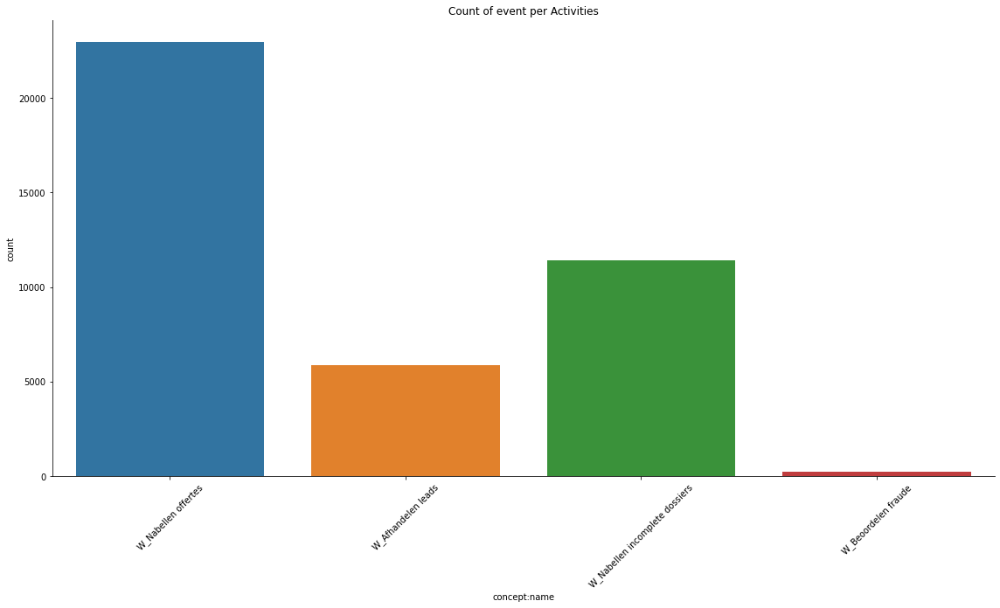

In [ ]:
fig = sns.catplot(x='concept:name', kind='count', data=GA_model_df, height=8, aspect=2)
plt.xticks(rotation=45)
plt.title('Count of event per Activities')
plt.show(fig)

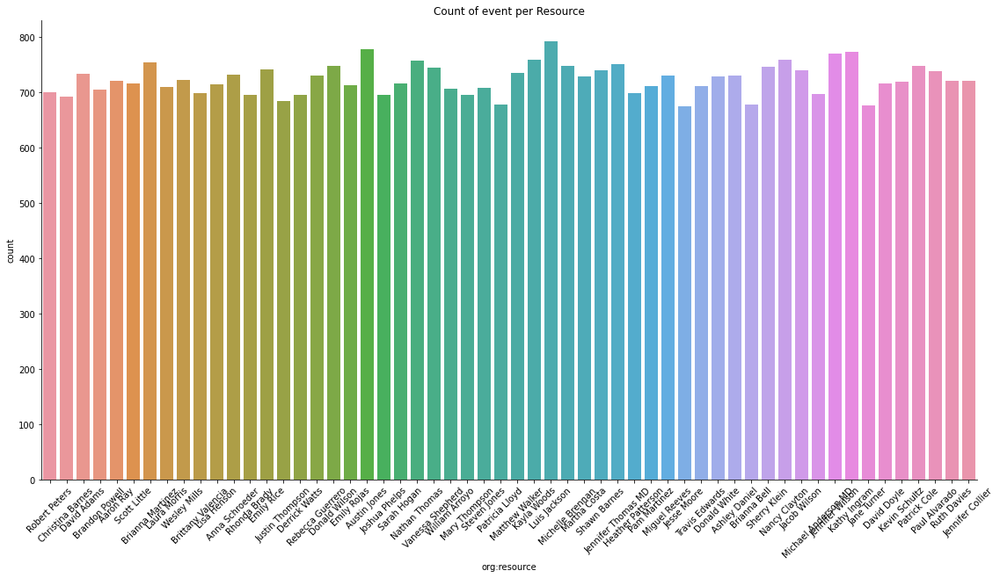

In [ ]:
fig = sns.catplot(x='org:resource', kind='count', data=GA_model_df, height=8, aspect=2)
plt.xticks(rotation=45)
plt.title('Count of event per Resource')
plt.show(fig)

In [ ]:
#ax=sns.countplot(x=GA_model_df['org:resource'],data=GA_model_df)

#ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")  #it will rotate text on x axis

#plt.tight_layout()
#plt.show()

In [ ]:
activities = pm4py.get_event_attribute_values(GA_model_df, "concept:name")
resources = pm4py.get_event_attribute_values(GA_model_df, "org:resource")

In [ ]:
activities

{'W_Nabellen offertes': 22976,
 'W_Nabellen incomplete dossiers': 11407,
 'W_Afhandelen leads': 5898,
 'W_Beoordelen fraude': 270}

In [ ]:
resources

{'Luis Jackson': 792,
 'Austin Jones': 779,
 'Kathy Ingram': 773,
 'Jennifer Wilson': 771,
 'Kayla Woods': 760,
 'Nancy Clayton': 759,
 'Nathan Thomas': 757,
 'Brianna Martinez': 755,
 'Jennifer Thomas MD': 751,
 'Michelle Brennan': 749,
 'Patrick Cole': 749,
 'Donald Wilson': 748,
 'Sherry Klein': 746,
 'Vanessa Shepherd': 745,
 'Emily Rice': 742,
 'Jacob Wilson': 741,
 'Shawn Barnes': 740,
 'Paul Alvarado': 738,
 'Matthew Walker': 735,
 'David Adams': 734,
 'Anna Schroeder': 733,
 'Rebecca Guerrero': 731,
 'Ashley Daniel': 731,
 'Miguel Reeves': 730,
 'Donald White': 729,
 'Martha Costa': 729,
 'Wesley Mills': 723,
 'Jennifer Collier': 722,
 'Aaron Ray': 722,
 'Ruth Davies': 721,
 'Kevin Schultz': 719,
 'Scott Little': 717,
 'Sarah Hogan': 717,
 'David Doyle': 717,
 'Lisa Henson': 715,
 'Emily Rojas': 714,
 'Travis Edwards': 711,
 'Pam Martinez': 711,
 'Laura Morris': 710,
 'Steven Jones': 709,
 'William Arroyo': 707,
 'Brandon Powell': 706,
 'Robert Peters': 701,
 'Heather Patterson

### VISPM https://github.com/AdamBanham/vispm

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[StaticDottedChartPresentor] Cleaning up plot... 
[StaticDottedChartPresentor] Plot is ready to show... 


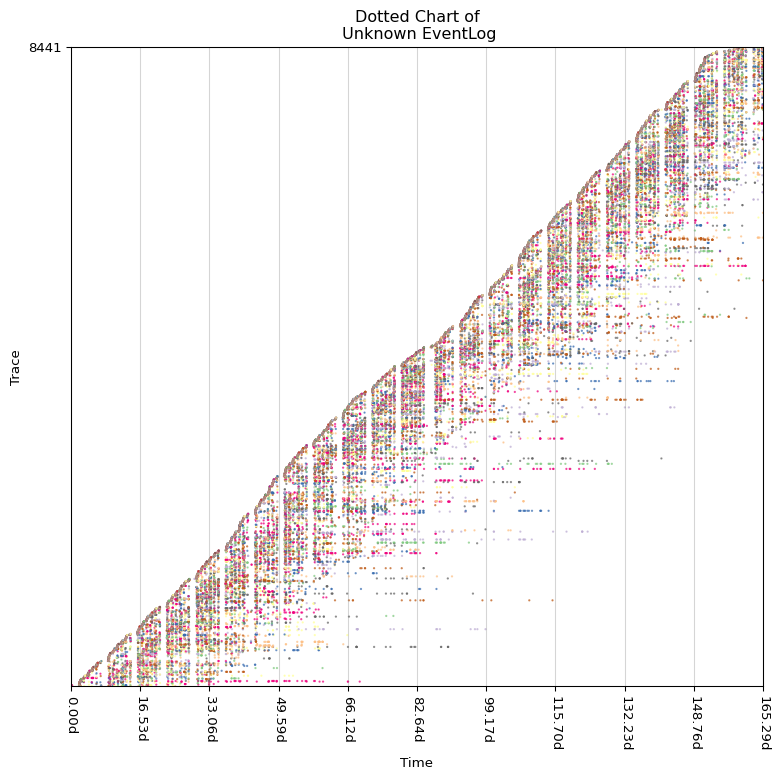

In [ ]:
# Static Presentors
from vispm import StaticDottedChartPresentor
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM,EARTH,COOL_WINTER,CATEGORICAL
from matplotlib import pyplot as plt

presentor = StaticDottedChartPresentor(GA_model)
presentor.plot()
plt.show()

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Added extension : DottedColourHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedColourHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedColourHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedColourHistogramExtension 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[DottedColourHistogramExtension] ploting histogram... 
[DottedColourHistogramExtension] ploting histogram... 
[DottedColourHistogramExtension] ploting histogram... 
[DottedColourHistogramExtension] ploting histogram... 
[StaticDottedChartPresentor] Cleaning up plot... 
[StaticDottedChartPresentor] Plot is ready to show... 


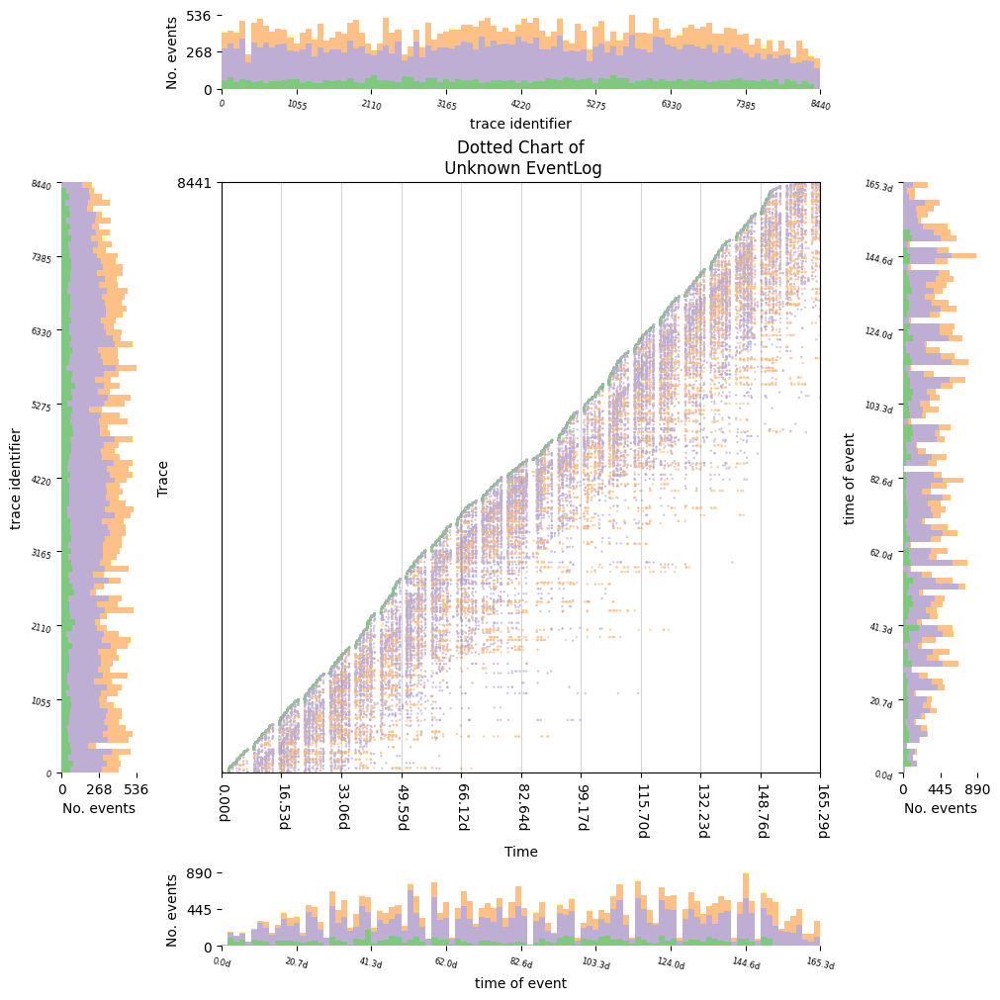

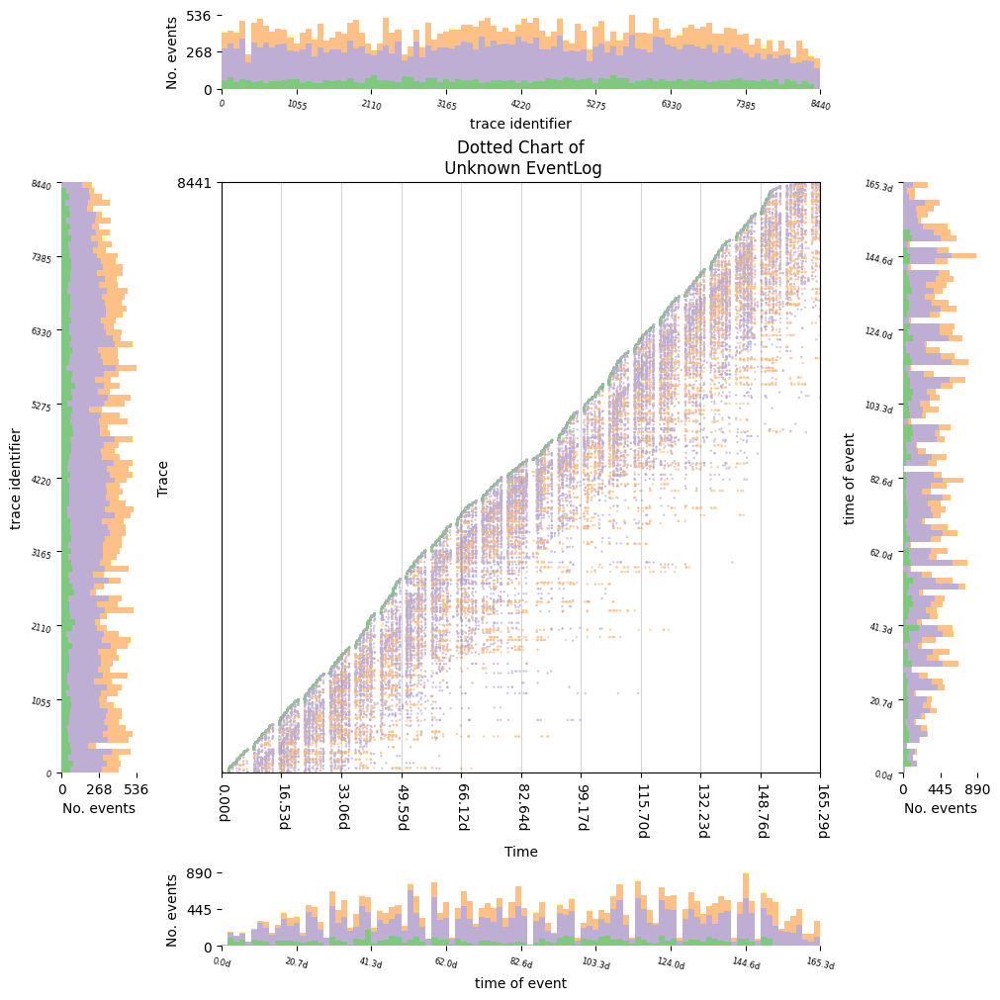

In [ ]:
# DottedColourHistogramExtension
#This extension plots a histogram based on the events within a dotted chart. Events will be broken down by colour for each bin.
from vispm import StaticDottedChartPresentor, DottedColourHistogramExtension
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM,EARTH,COOL_WINTER,CATEGORICAL


presentor = StaticDottedChartPresentor(GA_model,dpi=100,
    event_colour_scheme=StaticDottedChartPresentor.EventColourScheme.EventLabel,
    colormap=CATEGORICAL
)
ext = DottedColourHistogramExtension(direction=DottedColourHistogramExtension.Direction.NORTH)
presentor.add_extension(ext)
ext = DottedColourHistogramExtension(direction=DottedColourHistogramExtension.Direction.SOUTH,
         bin_axes=DottedColourHistogramExtension.PlotAxes.X)
presentor.add_extension(ext)
ext = DottedColourHistogramExtension(direction=DottedColourHistogramExtension.Direction.WEST)
presentor.add_extension(ext)
ext = DottedColourHistogramExtension(direction=DottedColourHistogramExtension.Direction.EAST,
         bin_axes=DottedColourHistogramExtension.PlotAxes.X)
presentor.add_extension(ext)
presentor.plot()

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[DottedEventHistogramExtension] ploting histogram... 
[DottedEventHistogramExtension] Event labels are imputed as :: {'W_Afhandelen leads': 'A', 'W_Beoordelen fraude': 'B', 'W_Nabellen offertes': 'C', 'W_Nabellen incomplete dossiers': 'D'} 
[DottedEventHistogramExtension] ploting histogram... 
[DottedEventHistogramExtension] Event labels are imputed as :: {'W_Afhandelen leads': 'A', 'W_Beoordelen 

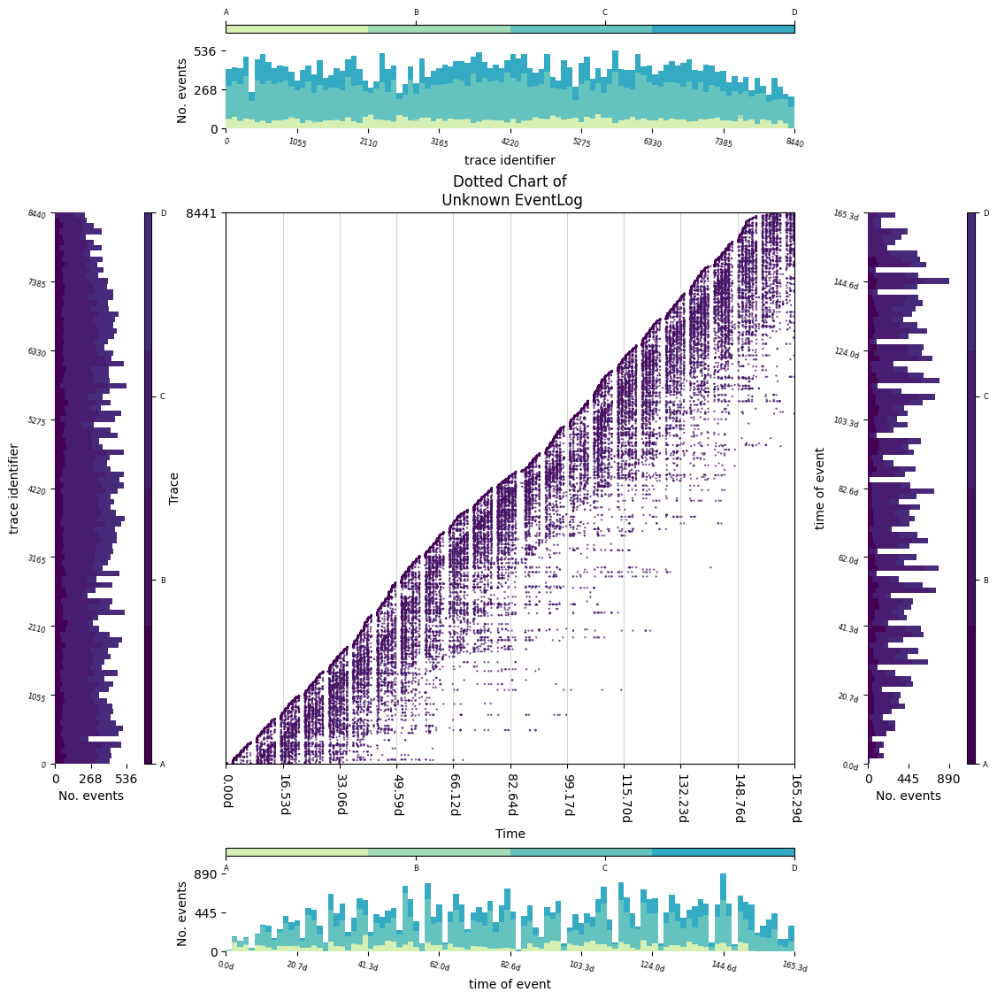

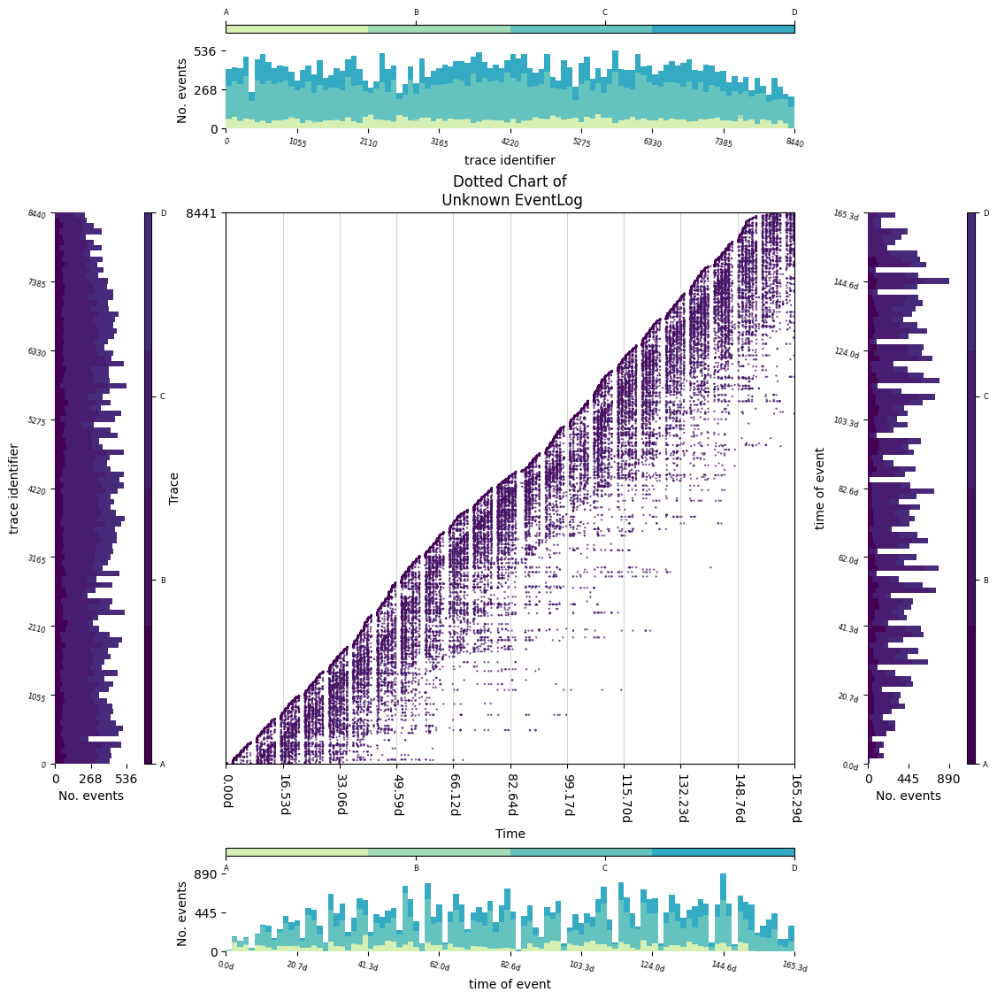

In [ ]:
# 1. setup up colour schemes to use
from vispm import StaticDottedChartPresentor, DottedColourHistogramExtension, DottedEventHistogramExtension
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM
from vispm.helpers.colours.colourmaps import EARTH,COOL_WINTER
from vispm import StaticDottedChartPresentor,DottedColourHistogramExtension

import numpy as np
from matplotlib.colors import ListedColormap
from matplotlib.cm import get_cmap

colourmaps = [COOL_WINTER,EARTH,HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM]
seq_colourmap = np.vstack(
    (
    colourmaps[0](np.linspace(0.20,1,8)),
    colourmaps[1](np.linspace(0.20,1,8)),
    colourmaps[2](np.linspace(0.20,1,8)),
    colourmaps[3](np.linspace(0.20,1,8))
    
    )
)
seq_colourmap = ListedColormap(seq_colourmap, name='VARIANCE')
cmap = get_cmap(HIGH_CONTRAST_COOL, 26)


# 2. create a presentor and add extensions
presentor = StaticDottedChartPresentor(GA_model,dpi=100,
    event_colour_scheme=StaticDottedChartPresentor.EventColourScheme.EventLabel,
    colormap=cmap
)

ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.SOUTH,
    bin_axes=DottedEventHistogramExtension.PlotAxes.X,
    colourmap=seq_colourmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.NORTH,
    bin_axes=DottedEventHistogramExtension.PlotAxes.Y,
    colourmap=seq_colourmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.WEST,
    bin_axes=DottedEventHistogramExtension.PlotAxes.Y,
    colourmap=cmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.EAST,
    bin_axes=DottedEventHistogramExtension.PlotAxes.X,
    colourmap=cmap
)
presentor.add_extension(ext)

presentor.plot()

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[DottedEventHistogramExtension] ploting histogram... 
[DottedEventHistogramExtension] Event labels are imputed as :: {'W_Afhandelen leads': 'A', 'W_Beoordelen fraude': 'B', 'W_Nabellen offertes': 'C', 'W_Nabellen incomplete dossiers': 'D'} 
[DottedEventHistogramExtension] ploting histogram... 
[DottedEventHistogramExtension] Event labels are imputed as :: {'W_Afhandelen leads': 'A', 'W_Beoordelen 

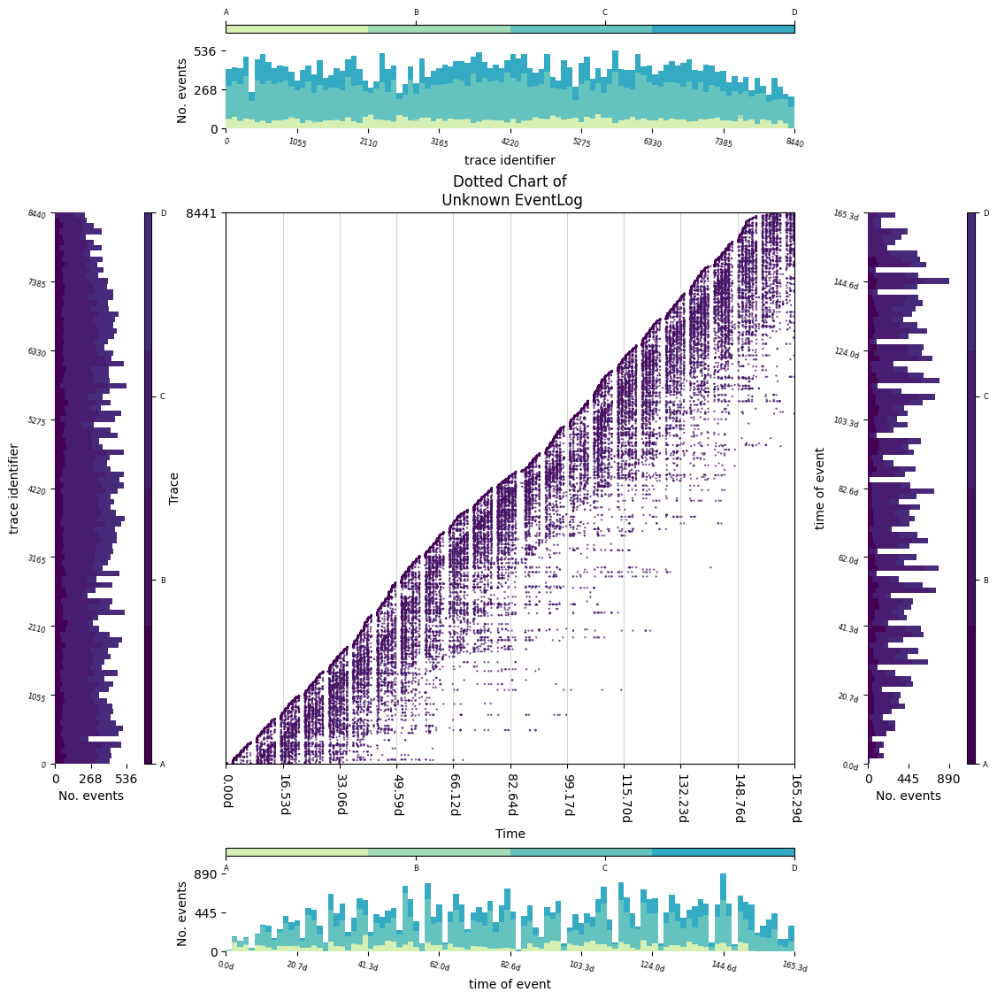

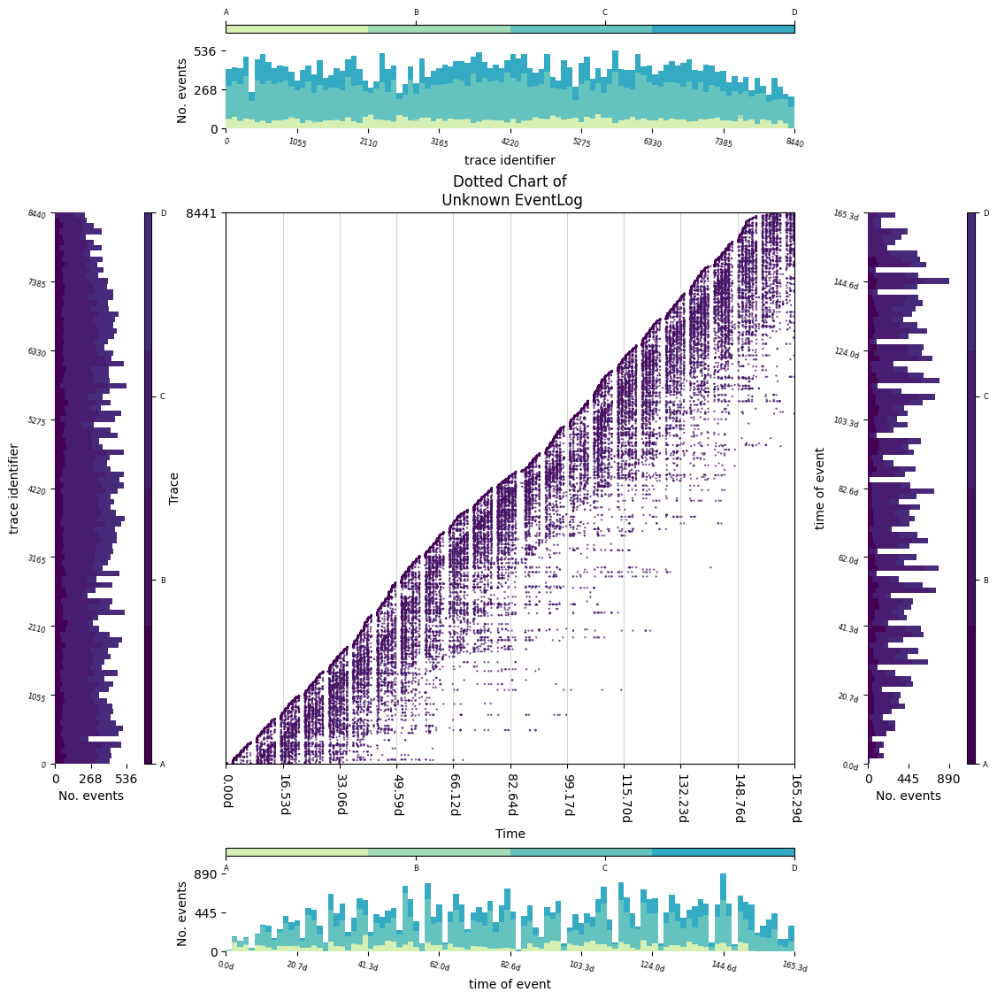

In [ ]:
# 1. setup up colour schemes to use
from vispm import StaticDottedChartPresentor, DottedColourHistogramExtension, DottedEventHistogramExtension
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM,EARTH,COOL_WINTER,CATEGORICAL
from vispm import StaticDottedChartPresentor,DottedColourHistogramExtension

import numpy as np
from matplotlib.colors import ListedColormap
from matplotlib.cm import get_cmap

colourmaps = [COOL_WINTER,EARTH,HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM, CATEGORICAL]
seq_colourmap = np.vstack(
    (
    colourmaps[0](np.linspace(0.20,1,8)),
    colourmaps[1](np.linspace(0.20,1,8)),
    colourmaps[2](np.linspace(0.20,1,8)),
    colourmaps[3](np.linspace(0.20,1,8)),
    colourmaps[4](np.linspace(0.20,1,8))
    
    )
)
seq_colourmap = ListedColormap(seq_colourmap, name='VARIANCE')
cmap = get_cmap(HIGH_CONTRAST_COOL, 26)


# 2. create a presentor and add extensions
presentor = StaticDottedChartPresentor(GA_model,dpi=100,
    event_colour_scheme=StaticDottedChartPresentor.EventColourScheme.EventLabel,
    colormap=cmap
)

ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.SOUTH,
    bin_axes=DottedEventHistogramExtension.PlotAxes.X,
    colourmap=seq_colourmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.NORTH,
    bin_axes=DottedEventHistogramExtension.PlotAxes.Y,
    colourmap=seq_colourmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.WEST,
    bin_axes=DottedEventHistogramExtension.PlotAxes.Y,
    colourmap=cmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.EAST,
    bin_axes=DottedEventHistogramExtension.PlotAxes.X,
    colourmap=cmap
)
presentor.add_extension(ext)

presentor.plot()

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Added extension : DescriptionHistogramExtension 
[StaticDottedChartPresentor] Added extension : DescriptionHistogramExtension 
[StaticDottedChartPresentor] Added extension : DescriptionHistogramExtension 
[StaticDottedChartPresentor] Added extension : DescriptionHistogramExtension 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[DescriptionHistogramExtension] plotting histogram 
[DescriptionHistogramExtension] Event labels are imputed as :: {'W_Afhandelen leads': 'A', 'W_Beoordelen fraude': 'B', 'W_Nabellen offertes': 'C', 'W_Nabellen incomplete dossiers': 'D'} 
[DescriptionHistogramExtension] plotting histogram 
[DescriptionHistogramExtension] plotting histogram 
[DescriptionHistogramExtension] plotting histogram 
[Stat

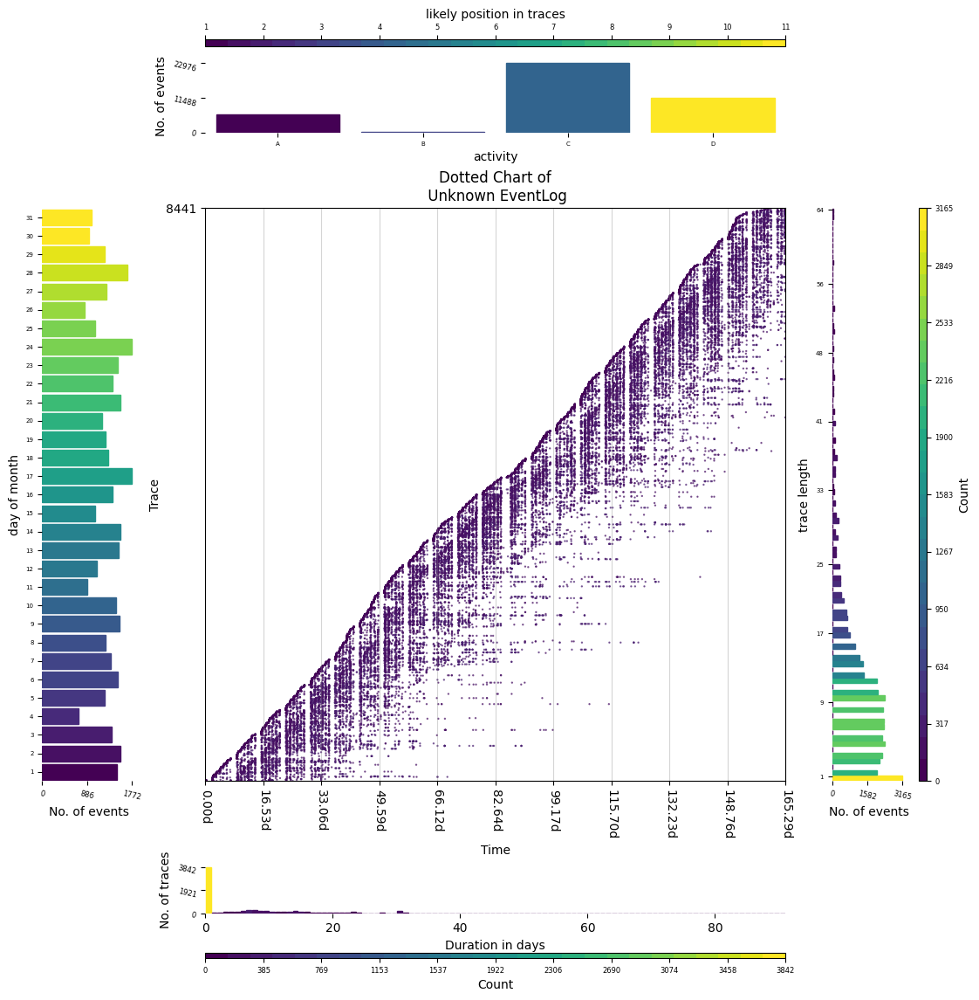

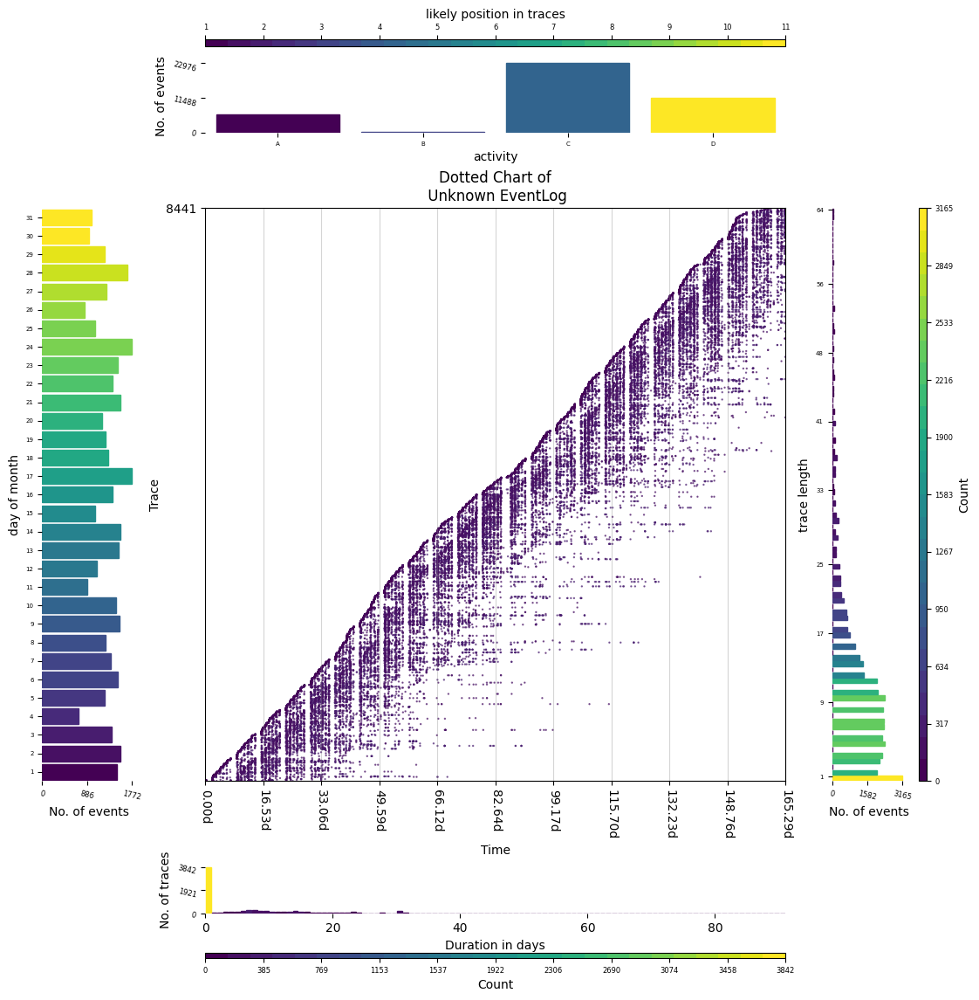

In [ ]:
#DescriptionHistogramExtension
#This extension describes an aspect of the event log.
# For example, a breakdown of trace duration, or trace length (by the number of activities), or event label, or when events occur (weekday or monthday).

#The following example shows how to use this extension to understand the properties of event log, alongside a dotted chart.


from vispm import DescriptionHistogramExtension
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM,EARTH,COOL_WINTER,CATEGORICAL
from vispm import StaticDottedChartPresentor,DottedColourHistogramExtension


cmap = get_cmap(HIGH_CONTRAST_COOL, 26)
presentor = StaticDottedChartPresentor(GA_model,dpi=100,
    event_colour_scheme=StaticDottedChartPresentor.EventColourScheme.EventLabel,
    colormap=cmap
)

ext = DescriptionHistogramExtension(
)
presentor.add_extension(ext)

ext = DescriptionHistogramExtension(
    direction=DescriptionHistogramExtension.Direction.EAST,
    describe=DescriptionHistogramExtension.Describe.TraceLength,
    density=DescriptionHistogramExtension.Density.Event
)
presentor.add_extension(ext)

ext = DescriptionHistogramExtension(
    direction=DescriptionHistogramExtension.Direction.SOUTH,
    describe=DescriptionHistogramExtension.Describe.TraceDuration,
    density=DescriptionHistogramExtension.Density.Trace
)
presentor.add_extension(ext)

ext = DescriptionHistogramExtension(
    direction=DescriptionHistogramExtension.Direction.WEST,
    describe=DescriptionHistogramExtension.Describe.Monthday,
    density=DescriptionHistogramExtension.Density.Event
)
presentor.add_extension(ext)

presentor.plot()